In [18]:
import pandas as pd
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt
from datetime import datetime 

In [19]:
dairy = pd.read_csv("../DairyGoods/dairy_dataset.csv")
dairy.head(5)

,Location,Total Land Area (acres),Number of Cows,Farm Size,Date,Product ID,Product Name,Brand,Quantity (liters/kg),Price per Unit,...,Production Date,Expiration Date,Quantity Sold (liters/kg),Price per Unit (sold),Approx. Total Revenue(INR),Customer Location,Sales Channel,Quantity in Stock (liters/kg),Minimum Stock Threshold (liters/kg),Reorder Quantity (liters/kg)
0,Telangana,310.84,96,Medium,2022-02-17,5,Ice Cream,Dodla Dairy,222.40,85.72,...,2021-12-27,2022-01-21,7,82.24,575.68,Madhya Pradesh,Wholesale,215,19.55,64.03
1,Uttar Pradesh,19.19,44,Large,2021-12-01,1,Milk,Amul,687.48,42.61,...,2021-10-03,2021-10-25,558,39.24,21895.92,Kerala,Wholesale,129,43.17,181.10
2,Tamil Nadu,581.69,24,Medium,2022-02-28,4,Yogurt,Dodla Dairy,503.48,36.50,...,2022-01-14,2022-02-13,256,33.81,8655.36,Madhya Pradesh,Online,247,15.10,140.83
3,Telangana,908.00,89,Small,2019-06-09,3,Cheese,Britannia Industries,823.36,26.52,...,2019-05-15,2019-07-26,601,28.92,17380.92,Rajasthan,Online,222,74.50,57.68
4,Maharashtra,861.95,21,Medium,2020-12-14,8,Buttermilk,Mother Dairy,147.77,83.85,...,2020-10-17,2020-10-28,145,83.07,12045.15,Jharkhand,Retail,2,76.02,33.40


In [20]:
## Checking columns/features
print("The columns of the dairy dataset are", dairy.columns)

The columns of the dairy dataset are Index(['Location', 'Total Land Area (acres)', 'Number of Cows', 'Farm Size',
       'Date', 'Product ID', 'Product Name', 'Brand', 'Quantity (liters/kg)',
       'Price per Unit', 'Total Value', 'Shelf Life (days)',
       'Storage Condition', 'Production Date', 'Expiration Date',
       'Quantity Sold (liters/kg)', 'Price per Unit (sold)',
       'Approx. Total Revenue(INR)', 'Customer Location', 'Sales Channel',
       'Quantity in Stock (liters/kg)', 'Minimum Stock Threshold (liters/kg)',
       'Reorder Quantity (liters/kg)'],
      dtype='object')


In [21]:
dairy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4325 entries, 0 to 4324
Data columns (total 23 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Location                             4325 non-null   object 
 1   Total Land Area (acres)              4325 non-null   float64
 2   Number of Cows                       4325 non-null   int64  
 3   Farm Size                            4325 non-null   object 
 4   Date                                 4325 non-null   object 
 5   Product ID                           4325 non-null   int64  
 6   Product Name                         4325 non-null   object 
 7   Brand                                4325 non-null   object 
 8   Quantity (liters/kg)                 4325 non-null   float64
 9   Price per Unit                       4325 non-null   float64
 10  Total Value                          4325 non-null   float64
 11  Shelf Life (days)             

Plotting simple univariate data

Text(0.5, 1.0, 'Product ID frequencies')

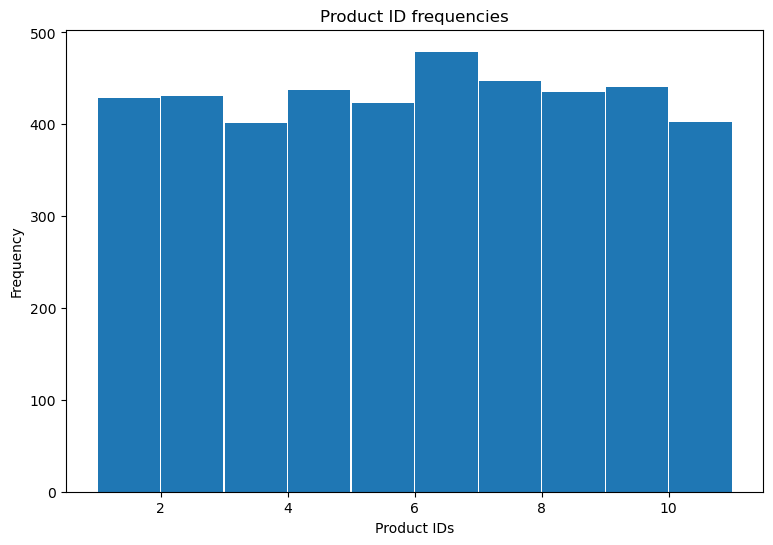

In [22]:
## Plotting product IDs

plt.figure(figsize = (9,6))

plt.hist(dairy['Product ID'], 
                bins = 10, 
                range = (1, 11),
                align = 'mid',
                rwidth = 0.98)
plt.xlabel("Product IDs")
plt.ylabel("Frequency")

plt.title("Product ID frequencies")

In [23]:
dairy['Farm Size'].unique()

array(['Medium', 'Large', 'Small'], dtype=object)

In [24]:
## Function for creating dictionaries with categorical counts
def countscreate(df, cat):
    counts = {}
    for i in range(len(df)):
        if df[cat][i] in counts:
            counts[df[cat][i]] = counts[df[cat][i]] + 1
        else: 
            counts[df[cat][i]] = 1
    return counts

def propcreate(df, cat):
    counts = countscreate(df, cat)
    counts_prop = counts
    quant = df[cat].unique()
    for i in range(len(quant)):
        counts_prop[quant[i]] = counts[quant[i]]/len(df)


<Figure size 4000x4000 with 0 Axes>

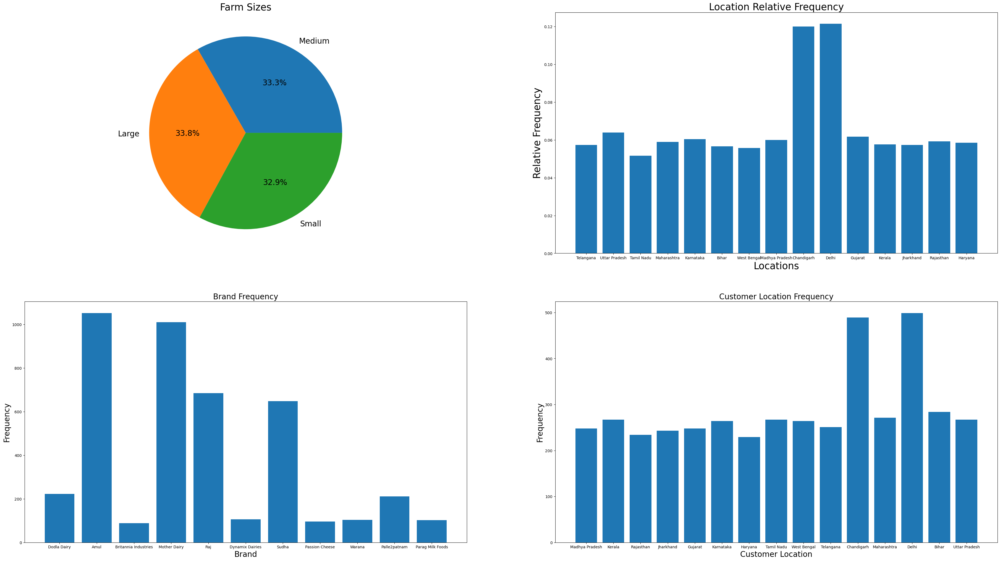

In [25]:
## Plotting some of univariate visualizations of categorical data - farm size, location, brand, and customer location

plt.figure(figsize = (40,40))
fig, axs = plt.subplots(nrows = 2, ncols = 2)

## Farm Size
farmsizes = {}
for i in range(len(dairy)):
    if dairy['Farm Size'][i] in farmsizes:
        farmsizes[dairy['Farm Size'][i]] = farmsizes[dairy['Farm Size'][i]] + 1
    else: 
        farmsizes[dairy['Farm Size'][i]] = 1
farmsize_prop = farmsizes
sizes = dairy['Farm Size'].unique()
for i in range(len(sizes)):
    farmsize_prop[sizes[i]] = farmsizes[sizes[i]]/len(dairy)
axs[0,0].pie(farmsize_prop.values(), 
            labels = dairy['Farm Size'].unique(),
            autopct = '%1.1f%%',
            textprops = {'fontsize' : 20})
axs[0,0].set_title("Farm Sizes", fontsize = 25)

## Location
location = {}
for i in range(len(dairy)):
    if dairy['Location'][i] in location:
        location[dairy['Location'][i]] = location[dairy['Location'][i]] + 1
    else: 
        location[dairy['Location'][i]] = 1
location_prop = location
locations = dairy['Location'].unique()
for i in range(len(locations)):
    location_prop[locations[i]] = location[locations[i]]/len(dairy)
axs[0,1].bar(locations, location_prop.values())
axs[0,1].set_title("Location Relative Frequency", fontsize = 25)
axs[0,1].set_xlabel("Locations", fontsize = 25)
axs[0,1].set_ylabel("Relative Frequency", fontsize = 25)

## Brand 
brand = countscreate(dairy, 'Brand')
brands = dairy['Brand'].unique()
axs[1,0].bar(brands, brand.values())
axs[1,0].set_xlabel('Brand', fontsize = 20)
axs[1,0].set_ylabel('Frequency', fontsize = 20)
axs[1,0].set_title('Brand Frequency', fontsize = 20)

## Customer Location
custloc = countscreate(dairy, 'Customer Location')
custlocs = dairy['Customer Location'].unique()
axs[1,1].bar(custlocs, custloc.values())
axs[1,1].set_xlabel('Customer Location', fontsize = 20)
axs[1,1].set_ylabel('Frequency', fontsize = 20)
axs[1,1].set_title('Customer Location Frequency', fontsize = 20)

plt.subplots_adjust(left = 0.5, right = 6, top = 5, bottom = 1)


# Univariate Quantitative Data

<Axes: xlabel='Minimum Stock Threshold (liters/kg)', ylabel='Count'>

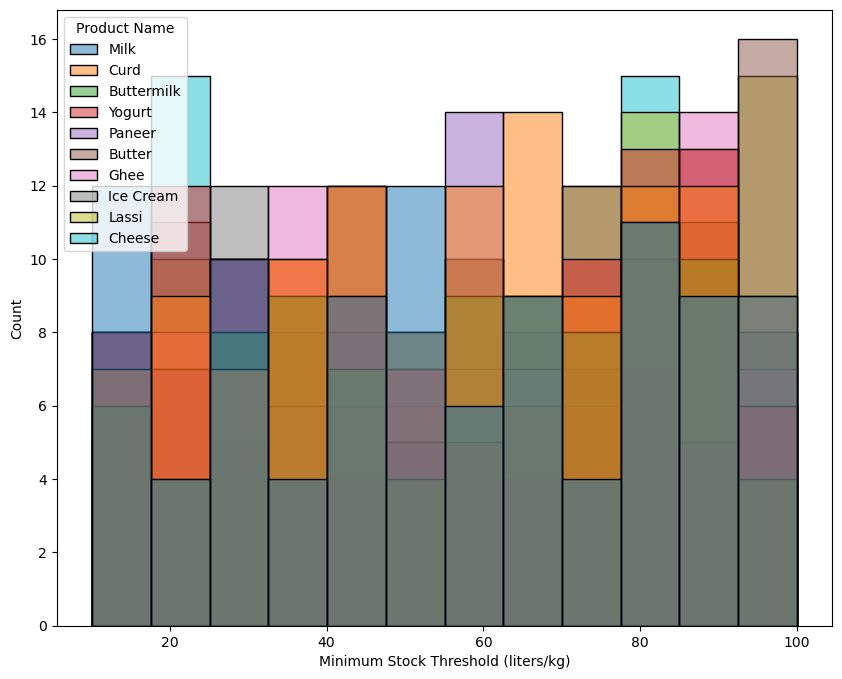

In [26]:
## Minimum Stock Threshold
plt.figure(figsize = (10,8))

sns.histplot(data = dairy[dairy['Brand'] == 'Amul'],
            x = 'Minimum Stock Threshold (liters/kg)',
            hue = 'Product Name')


# Bivariate Quantitative Data

In [27]:
dairy.head()

,Location,Total Land Area (acres),Number of Cows,Farm Size,Date,Product ID,Product Name,Brand,Quantity (liters/kg),Price per Unit,...,Production Date,Expiration Date,Quantity Sold (liters/kg),Price per Unit (sold),Approx. Total Revenue(INR),Customer Location,Sales Channel,Quantity in Stock (liters/kg),Minimum Stock Threshold (liters/kg),Reorder Quantity (liters/kg)
0,Telangana,310.84,96,Medium,2022-02-17,5,Ice Cream,Dodla Dairy,222.40,85.72,...,2021-12-27,2022-01-21,7,82.24,575.68,Madhya Pradesh,Wholesale,215,19.55,64.03
1,Uttar Pradesh,19.19,44,Large,2021-12-01,1,Milk,Amul,687.48,42.61,...,2021-10-03,2021-10-25,558,39.24,21895.92,Kerala,Wholesale,129,43.17,181.10
2,Tamil Nadu,581.69,24,Medium,2022-02-28,4,Yogurt,Dodla Dairy,503.48,36.50,...,2022-01-14,2022-02-13,256,33.81,8655.36,Madhya Pradesh,Online,247,15.10,140.83
3,Telangana,908.00,89,Small,2019-06-09,3,Cheese,Britannia Industries,823.36,26.52,...,2019-05-15,2019-07-26,601,28.92,17380.92,Rajasthan,Online,222,74.50,57.68
4,Maharashtra,861.95,21,Medium,2020-12-14,8,Buttermilk,Mother Dairy,147.77,83.85,...,2020-10-17,2020-10-28,145,83.07,12045.15,Jharkhand,Retail,2,76.02,33.40


In [28]:
dairy.columns

Index(['Location', 'Total Land Area (acres)', 'Number of Cows', 'Farm Size',
       'Date', 'Product ID', 'Product Name', 'Brand', 'Quantity (liters/kg)',
       'Price per Unit', 'Total Value', 'Shelf Life (days)',
       'Storage Condition', 'Production Date', 'Expiration Date',
       'Quantity Sold (liters/kg)', 'Price per Unit (sold)',
       'Approx. Total Revenue(INR)', 'Customer Location', 'Sales Channel',
       'Quantity in Stock (liters/kg)', 'Minimum Stock Threshold (liters/kg)',
       'Reorder Quantity (liters/kg)'],
      dtype='object')

Text(0.5, 1.0, 'Total Land Area vs. Minimum Stock Threshold (for Amul)')

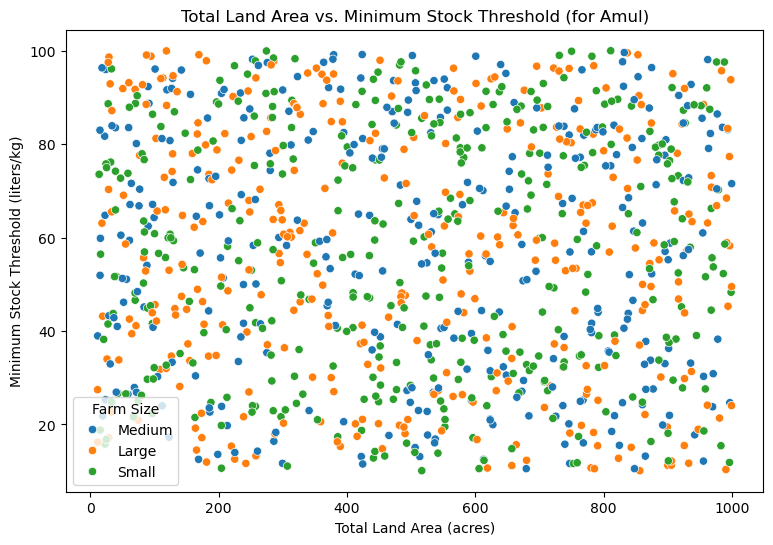

In [29]:
## Total Land Area vs. Minimum Stock Threshold

plt.figure(figsize = (9,6))

sns.scatterplot(x = dairy[dairy['Brand'] == 'Amul']['Total Land Area (acres)'],
                y = dairy['Minimum Stock Threshold (liters/kg)'],
                hue = dairy['Farm Size'])
plt.title("Total Land Area vs. Minimum Stock Threshold (for Amul)")


Text(0.5, 1.0, 'Shelf Life vs. Quantity Sold (days)')

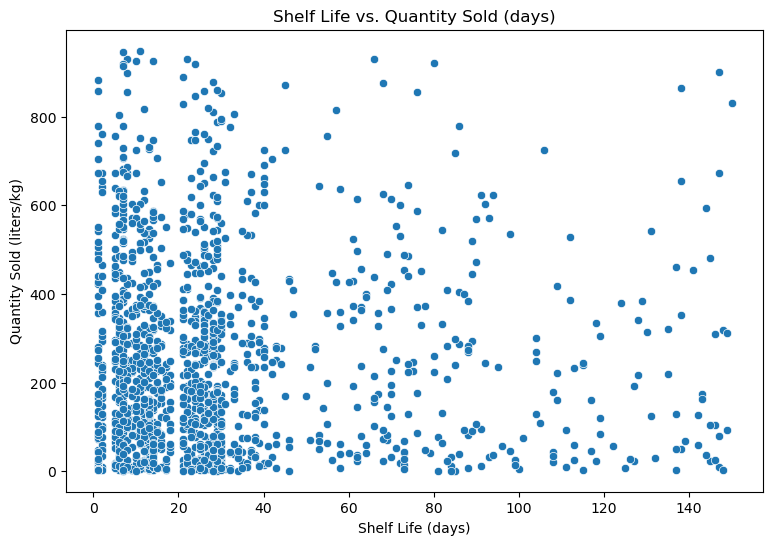

In [30]:
## Shelf Life vs. Quantity Sold
plt.figure(figsize = (9,6))

sns.scatterplot(x = dairy[dairy['Farm Size'] == 'Small']['Shelf Life (days)'],
                y = dairy['Quantity Sold (liters/kg)'])
plt.title("Shelf Life vs. Quantity Sold (days)")

Text(0.5, 1.0, 'Price per Unit (sold) vs. Quantity Sold (liters/kg) (for Yogurt)')

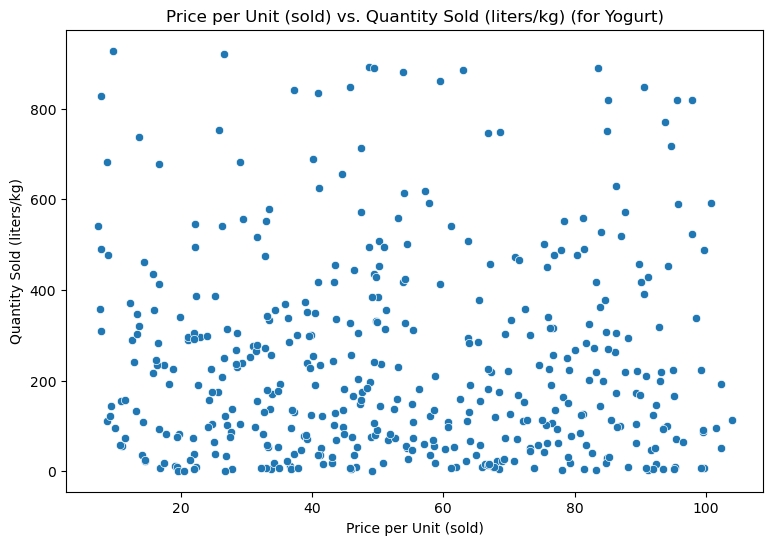

In [31]:
## Price per unit vs. Quantity Sold

plt.figure(figsize = (9,6))

sns.scatterplot(x = dairy[dairy['Product Name'] == 'Yogurt']['Price per Unit (sold)'],
                y = dairy['Quantity Sold (liters/kg)'])

plt.title("Price per Unit (sold) vs. Quantity Sold (liters/kg) (for Yogurt)")

Text(0.5, 1.0, 'Price per unit (sold) versus Shelf Life (days)')

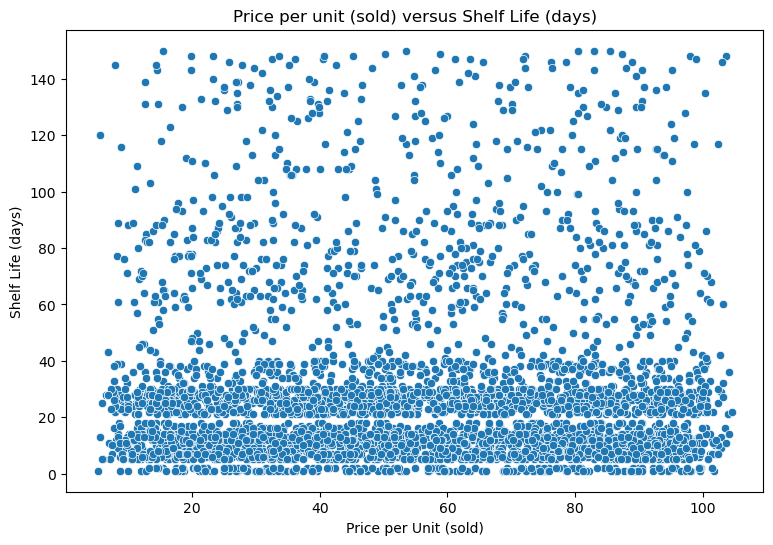

In [32]:
## Shelf Life vs. Price Per Unit

plt.figure(figsize = (9,6))

sns.scatterplot(x = dairy['Price per Unit (sold)'],
                y = dairy['Shelf Life (days)'])

plt.title("Price per unit (sold) versus Shelf Life (days)")


In [33]:
dairy['Storage Condition'].unique()

array(['Frozen', 'Tetra Pack', 'Refrigerated', 'Polythene Packet',
       'Ambient'], dtype=object)

Text(0.5, 1.0, 'Price per unit (sold) versus Shelf Life (days)')

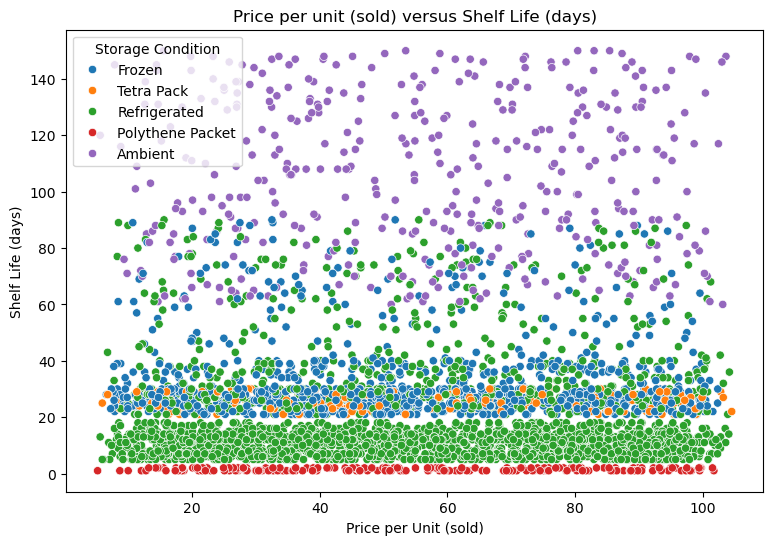

In [34]:
## Price per unit versus shelf life

plt.figure(figsize = (9,6))

sns.scatterplot(x = dairy['Price per Unit (sold)'],
                y = dairy['Shelf Life (days)'],
                hue = dairy['Storage Condition'])

plt.title("Price per unit (sold) versus Shelf Life (days)")

Text(0.5, 1.0, 'Production Date vs. Quantity Sold (for Amul)')

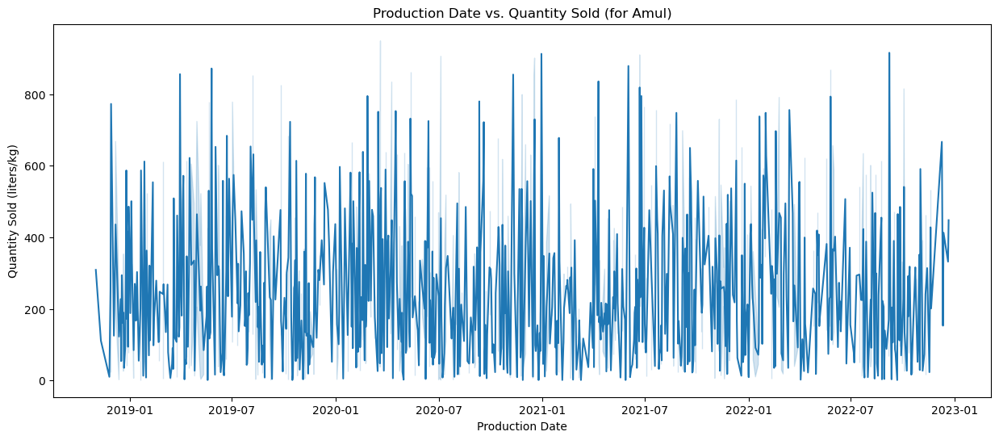

In [35]:
## Production Date vs. Quantity Sold

dairy['Production Date'] = pd.to_datetime(dairy['Production Date'])


plt.figure(figsize= (15,6))

firstdate = datetime(2019, 1, 1)
sns.lineplot(x = dairy[dairy['Brand'] == 'Amul']['Production Date'],
            y = dairy['Quantity Sold (liters/kg)'])

plt.title("Production Date vs. Quantity Sold (for Amul)")

C:\Users\tatep\AppData\Local\Temp\ipykernel_10800\1950469991.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(x = dairy[dairy['Product Name'] == 'Milk'][dairy['Brand'] == 'Amul']['Expiration Date'],


Text(0.5, 1.0, 'Expiration Date vs. Price Per Unit (Milk from Amul)')

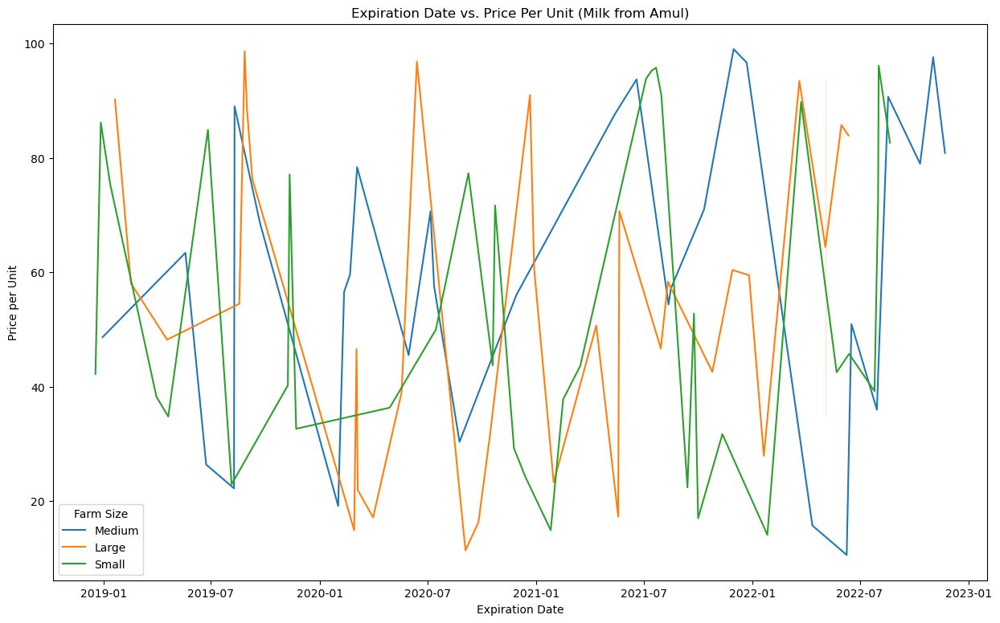

In [36]:
## Expiration Date vs. Price Per Unit (One Product)

plt.figure(figsize = (15, 9))

dairy['Expiration Date'] = pd.to_datetime(dairy['Expiration Date'])


sns.lineplot(x = dairy[dairy['Product Name'] == 'Milk'][dairy['Brand'] == 'Amul']['Expiration Date'],
                y = dairy['Price per Unit'],
                hue = dairy['Farm Size'])

plt.title("Expiration Date vs. Price Per Unit (Milk from Amul)")

In [37]:
dairy.head()

,Location,Total Land Area (acres),Number of Cows,Farm Size,Date,Product ID,Product Name,Brand,Quantity (liters/kg),Price per Unit,...,Production Date,Expiration Date,Quantity Sold (liters/kg),Price per Unit (sold),Approx. Total Revenue(INR),Customer Location,Sales Channel,Quantity in Stock (liters/kg),Minimum Stock Threshold (liters/kg),Reorder Quantity (liters/kg)
0,Telangana,310.84,96,Medium,2022-02-17,5,Ice Cream,Dodla Dairy,222.40,85.72,...,2021-12-27,2022-01-21,7,82.24,575.68,Madhya Pradesh,Wholesale,215,19.55,64.03
1,Uttar Pradesh,19.19,44,Large,2021-12-01,1,Milk,Amul,687.48,42.61,...,2021-10-03,2021-10-25,558,39.24,21895.92,Kerala,Wholesale,129,43.17,181.10
2,Tamil Nadu,581.69,24,Medium,2022-02-28,4,Yogurt,Dodla Dairy,503.48,36.50,...,2022-01-14,2022-02-13,256,33.81,8655.36,Madhya Pradesh,Online,247,15.10,140.83
3,Telangana,908.00,89,Small,2019-06-09,3,Cheese,Britannia Industries,823.36,26.52,...,2019-05-15,2019-07-26,601,28.92,17380.92,Rajasthan,Online,222,74.50,57.68
4,Maharashtra,861.95,21,Medium,2020-12-14,8,Buttermilk,Mother Dairy,147.77,83.85,...,2020-10-17,2020-10-28,145,83.07,12045.15,Jharkhand,Retail,2,76.02,33.40


C:\Users\tatep\AppData\Local\Temp\ipykernel_10800\2559798260.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(x = dairy[dairy['Product Name'] == 'Cheese'][dairy['Brand'] == 'Amul']['Date'],


Text(0.5, 1.0, 'Date of Sale vs. Approx. Total Revenue (INR) (For Cheese from Amul)')

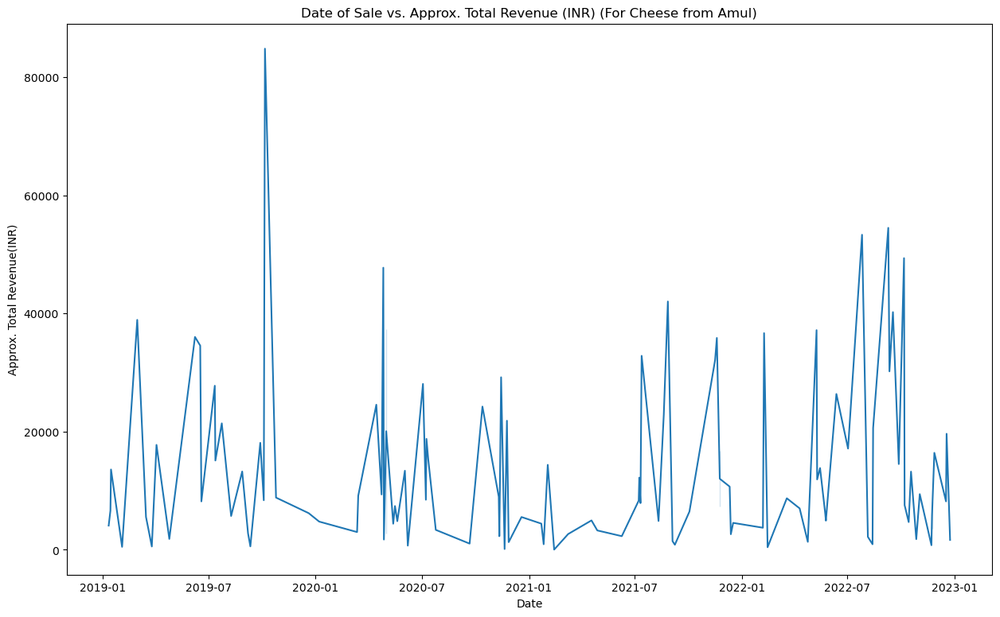

In [38]:
## Approximate Total Revenue vs. Date

plt.figure(figsize = (15, 9))

dairy['Date'] = pd.to_datetime(dairy['Date'])


sns.lineplot(x = dairy[dairy['Product Name'] == 'Cheese'][dairy['Brand'] == 'Amul']['Date'],
                y = dairy['Approx. Total Revenue(INR)'])

plt.title("Date of Sale vs. Approx. Total Revenue (INR) (For Cheese from Amul)")

In [39]:
## Normalizing total revenue

dairy['Normalized Approx. Total Rev'] = (dairy['Approx. Total Revenue(INR)'] - dairy['Approx. Total Revenue(INR)'].mean())/dairy['Approx. Total Revenue(INR)'].std()
dairy.head()

,Location,Total Land Area (acres),Number of Cows,Farm Size,Date,Product ID,Product Name,Brand,Quantity (liters/kg),Price per Unit,...,Expiration Date,Quantity Sold (liters/kg),Price per Unit (sold),Approx. Total Revenue(INR),Customer Location,Sales Channel,Quantity in Stock (liters/kg),Minimum Stock Threshold (liters/kg),Reorder Quantity (liters/kg),Normalized Approx. Total Rev
0,Telangana,310.84,96,Medium,2022-02-17,5,Ice Cream,Dodla Dairy,222.40,85.72,...,2022-01-21,7,82.24,575.68,Madhya Pradesh,Wholesale,215,19.55,64.03,-0.889689
1,Uttar Pradesh,19.19,44,Large,2021-12-01,1,Milk,Amul,687.48,42.61,...,2021-10-25,558,39.24,21895.92,Kerala,Wholesale,129,43.17,181.10,0.568903
2,Tamil Nadu,581.69,24,Medium,2022-02-28,4,Yogurt,Dodla Dairy,503.48,36.50,...,2022-02-13,256,33.81,8655.36,Madhya Pradesh,Online,247,15.10,140.83,-0.336930
3,Telangana,908.00,89,Small,2019-06-09,3,Cheese,Britannia Industries,823.36,26.52,...,2019-07-26,601,28.92,17380.92,Rajasthan,Online,222,74.50,57.68,0.260016
4,Maharashtra,861.95,21,Medium,2020-12-14,8,Buttermilk,Mother Dairy,147.77,83.85,...,2020-10-28,145,83.07,12045.15,Jharkhand,Retail,2,76.02,33.40,-0.105023


Text(0.5, 1.0, 'Production to Expiration vs. Normalized Approx. Total Revenue (for Amul)')

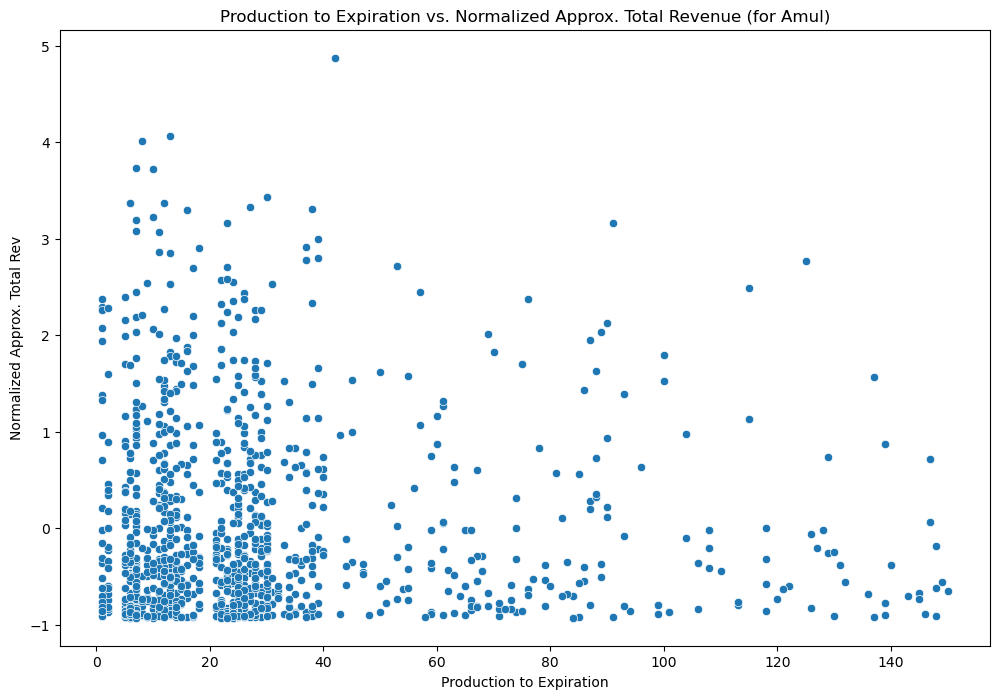

In [40]:
## Total Revenue vs. Difference Between Expiration Date and Production Date

plt.figure(figsize = (12,8))

dairy[['Expiration Date', 'Production Date']] = dairy[['Expiration Date', 'Production Date']].apply(pd.to_datetime)
dairy['Production to Expiration'] = (dairy['Expiration Date'] - dairy['Production Date']).dt.days
dairy.head()

sns.scatterplot(x = dairy[dairy['Brand'] == 'Amul']['Production to Expiration'],
                y = dairy['Normalized Approx. Total Rev'])

plt.title("Production to Expiration vs. Normalized Approx. Total Revenue (for Amul)")


# Summary Statistics

In [41]:
dairy.groupby(['Brand'])['Quantity Sold (liters/kg)'].describe()

,count,mean,std,min,25%,50%,75%,max
Brand,,,,,,,,
Amul,1053.0,251.139601,215.856690,1.0,73.00,192.0,384.00,949.0
Britannia Industries,88.0,239.170455,208.036647,6.0,51.00,192.0,358.50,757.0
Dodla Dairy,222.0,223.725225,207.668486,1.0,64.00,144.0,339.50,890.0
Dynamix Dairies,106.0,252.566038,226.129715,1.0,68.50,151.5,409.75,859.0
Mother Dairy,1010.0,249.252475,217.051146,1.0,66.00,193.0,371.50,956.0
Palle2patnam,211.0,242.270142,223.970083,1.0,64.50,165.0,347.00,920.0
Parag Milk Foods,102.0,262.372549,202.994314,1.0,94.25,221.0,397.75,759.0
Passion Cheese,96.0,284.333333,234.473640,1.0,91.75,240.0,426.75,934.0
Raj,685.0,255.097810,225.243061,1.0,71.00,197.0,391.00,960.0


In [42]:
dairy.groupby(['Brand'])['Reorder Quantity (liters/kg)'].describe()

,count,mean,std,min,25%,50%,75%,max
Brand,,,,,,,,
Amul,1053.0,108.246002,51.784524,20.02,63.1600,107.380,153.7900,199.95
Britannia Industries,88.0,104.431477,54.352223,20.04,59.6650,98.030,155.0200,197.40
Dodla Dairy,222.0,108.783378,49.924769,23.26,67.6650,108.130,148.8575,196.40
Dynamix Dairies,106.0,107.431038,52.176335,20.34,58.2525,106.645,150.1925,197.56
Mother Dairy,1010.0,108.022119,50.842552,20.09,64.1375,107.895,149.8775,199.68
Palle2patnam,211.0,110.941232,48.695219,21.95,72.8650,106.570,152.9400,197.15
Parag Milk Foods,102.0,112.771667,50.554776,21.44,67.0500,117.380,154.4525,197.51
Passion Cheese,96.0,104.140833,47.775905,23.88,67.4600,95.460,140.7525,196.69
Raj,685.0,111.937635,52.055945,20.21,64.3300,113.460,158.2400,199.81


In [43]:
dairy.groupby(['Farm Size'])['Minimum Stock Threshold (liters/kg)'].describe()

,count,mean,std,min,25%,50%,75%,max
Farm Size,,,,,,,,
Large,1462.0,55.668605,26.167956,10.02,33.2950,56.32,78.6100,99.93
Medium,1439.0,56.124281,26.352448,10.21,33.2800,56.66,79.4200,99.92
Small,1424.0,55.686608,26.402301,10.03,32.2175,56.40,79.1625,99.99


In [44]:
dairy.groupby(['Sales Channel'])['Quantity Sold (liters/kg)'].describe()

,count,mean,std,min,25%,50%,75%,max
Sales Channel,,,,,,,,
Online,1371.0,239.994894,210.063767,1.0,70.0,185.0,356.00,949.0
Retail,1478.0,253.590663,221.818195,1.0,67.0,192.5,387.00,945.0
Wholesale,1476.0,250.115854,218.454679,1.0,71.0,190.5,376.25,960.0


In [45]:
dairy.groupby(['Brand'])['Approx. Total Revenue(INR)'].describe()

,count,mean,std,min,25%,50%,75%,max
Brand,,,,,,,,
Amul,1053.0,13873.565489,14688.162512,16.30,2923.2000,8187.660,20561.3100,84838.46
Britannia Industries,88.0,11699.114205,12352.926512,222.09,2554.8725,6904.600,18293.8850,55540.50
Dodla Dairy,222.0,11733.591757,13476.468411,26.77,2531.0850,7109.240,15045.8625,60313.95
Dynamix Dairies,106.0,13961.177170,15479.728595,12.54,3257.3800,8632.020,18022.8125,66323.46
Mother Dairy,1010.0,13630.481653,14549.264974,14.99,2886.0550,8879.460,19969.6650,85352.94
Palle2patnam,211.0,11985.730427,14408.714338,19.66,2788.7900,6655.000,16610.3650,78214.50
Parag Milk Foods,102.0,14869.585392,14034.184572,23.89,3901.5300,11131.690,21189.8975,62856.66
Passion Cheese,96.0,15610.970312,15100.366592,34.22,3962.8000,12095.525,24101.3025,73718.57
Raj,685.0,13957.339620,15192.797462,21.12,3242.6800,8376.000,19950.4000,89108.90


## Beginning Time Series Plots

Text(0.5, 1.0, 'Recording Date vs. Quantity Sold (liters/kg)')

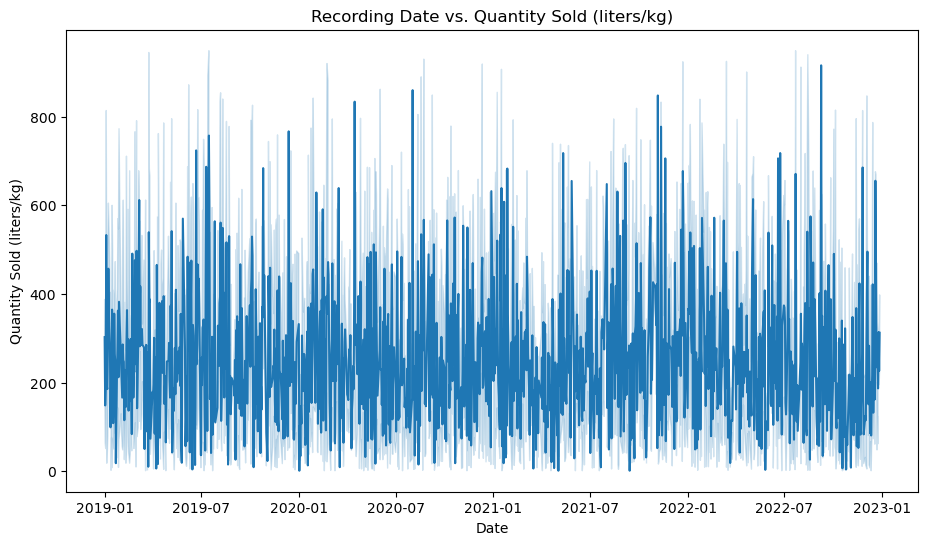

In [46]:
## Recording Date versus quantity sold
plt.figure(figsize= (11,6))

sns.lineplot(x = dairy['Date'],
                y = dairy['Quantity Sold (liters/kg)'])

plt.title("Recording Date vs. Quantity Sold (liters/kg)")

Text(0.5, 1.0, 'Recording Date vs. Quantity Sold (liters/kg)')

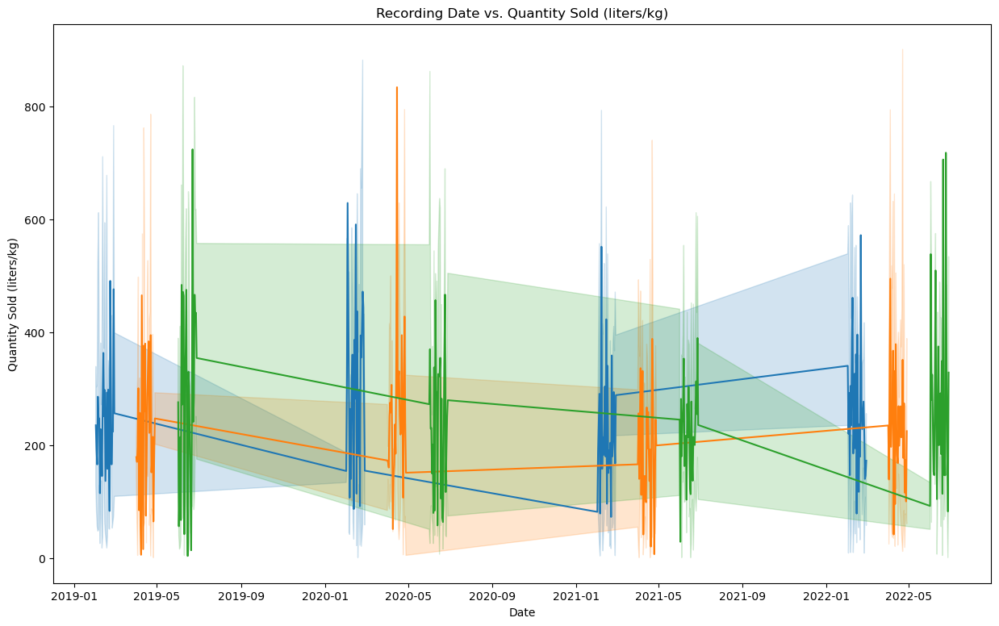

In [47]:
## Looking a Recording Date versus Quantity Sold in certain months

plt.figure(figsize= (15,9))

sns.lineplot(x = dairy[dairy['Date'].dt.month == 2]['Date'],
                y = dairy['Quantity Sold (liters/kg)'])
sns.lineplot(x = dairy[dairy['Date'].dt.month == 4]['Date'],
                y = dairy['Quantity Sold (liters/kg)'])
sns.lineplot(x = dairy[dairy['Date'].dt.month == 6]['Date'],
                y = dairy['Quantity Sold (liters/kg)'])

plt.title("Recording Date vs. Quantity Sold (liters/kg)")

Text(0.5, 1.0, 'Date of Sale vs. Quantity Sold (liters/kg) in 2019')

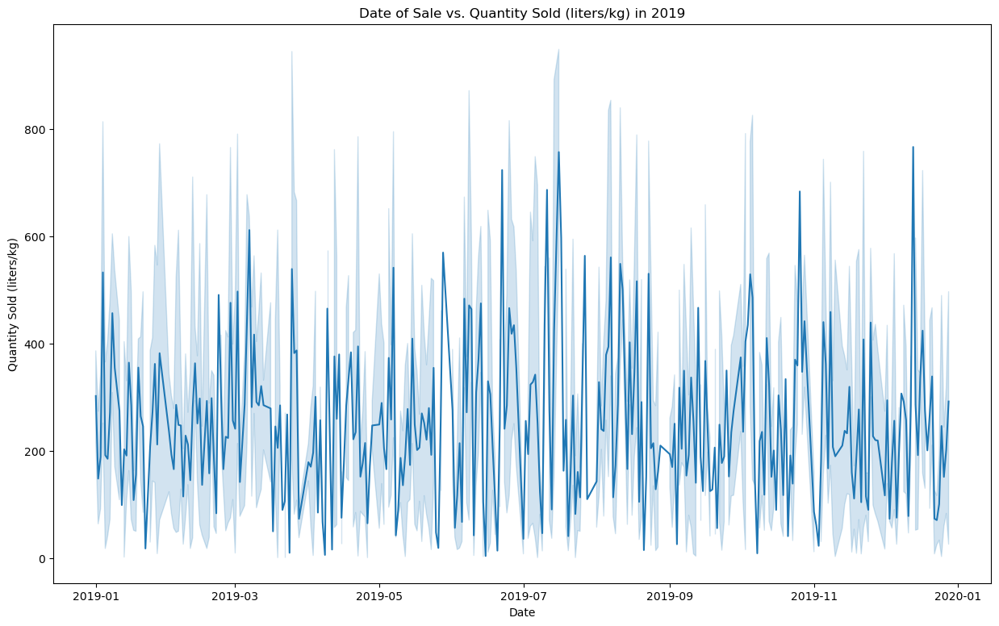

In [ ]:
plt.figure(figsize= (15,9))

sns.lineplot(x = dairy[dairy['Date'].dt.year == 2019]['Date'],
                y = dairy['Quantity Sold (liters/kg)'])

plt.title("Date of Sale vs. Quantity Sold (liters/kg) in 2019")

In [48]:
## Making a season feature

dairy['Season'] = 'Winter'

dairy.loc[(dairy.Date.dt.month <= 6) & (dairy.Date.dt.month > 3),'Season'] = 'Spring'
dairy.loc[(dairy.Date.dt.month <= 9) & (dairy.Date.dt.month > 6),'Season'] = 'Summer'
dairy.loc[(dairy.Date.dt.month <= 12) & (dairy.Date.dt.month > 9),'Season'] = 'Fall'


In [49]:
dairy.sample(5)

,Location,Total Land Area (acres),Number of Cows,Farm Size,Date,Product ID,Product Name,Brand,Quantity (liters/kg),Price per Unit,...,Price per Unit (sold),Approx. Total Revenue(INR),Customer Location,Sales Channel,Quantity in Stock (liters/kg),Minimum Stock Threshold (liters/kg),Reorder Quantity (liters/kg),Normalized Approx. Total Rev,Production to Expiration,Season
4009,Jharkhand,131.51,54,Medium,2021-07-11,5,Ice Cream,Dodla Dairy,489.96,32.85,...,30.57,7887.06,Kerala,Online,231,84.26,145.33,-0.389492,28,Summer
3028,Maharashtra,877.39,24,Large,2020-07-10,8,Buttermilk,Sudha,187.64,87.28,...,92.04,13621.92,Uttar Pradesh,Online,39,86.63,87.77,0.002850,10,Summer
774,Delhi,453.78,80,Medium,2022-07-02,9,Paneer,Sudha,414.87,92.70,...,91.22,7844.92,Bihar,Retail,328,37.88,33.20,-0.392375,12,Summer
2055,Madhya Pradesh,685.61,34,Medium,2021-03-01,6,Curd,Sudha,538.58,32.78,...,32.56,12470.48,Jharkhand,Wholesale,155,36.03,197.54,-0.075924,5,Winter
812,Kerala,769.71,96,Large,2020-01-20,6,Curd,Sudha,796.65,34.51,...,32.61,228.27,Chandigarh,Retail,789,96.80,114.50,-0.913456,5,Winter


Text(0.5, 1.0, 'Recording Date vs. Quantity Sold (liters/kg) in 2019')

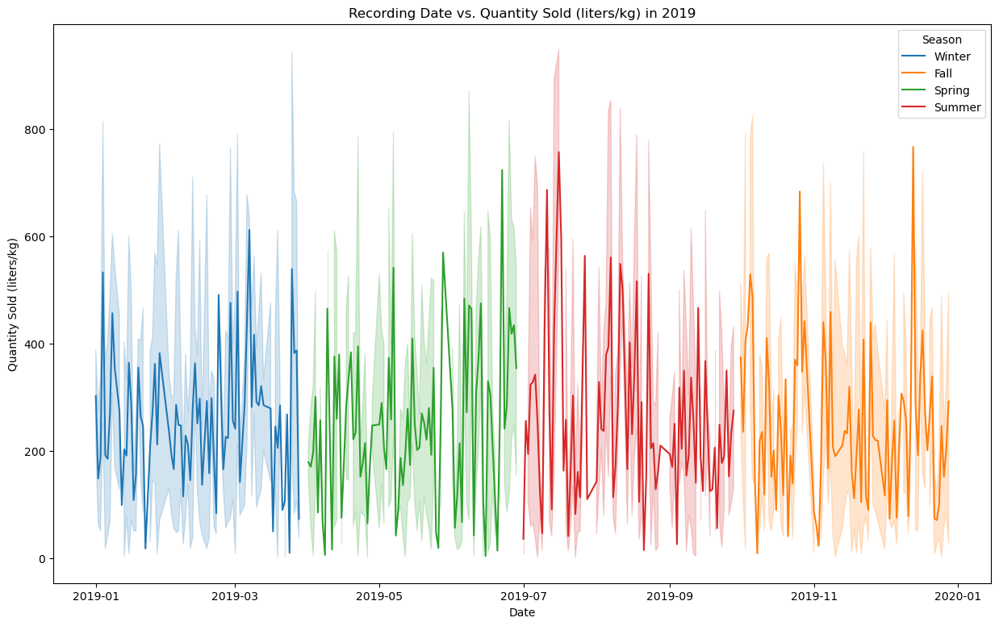

In [ ]:
## Quantity Sold in different seasons

plt.figure(figsize= (15,9))

sns.lineplot(x = dairy[dairy['Date'].dt.year == 2019]['Date'],
                y = dairy['Quantity Sold (liters/kg)'],
                hue = dairy.Season)

plt.title("Recording Date vs. Quantity Sold (liters/kg) in 2019")

Text(0.5, 1.0, 'Recording Date vs. Price per Unit (Sold)')

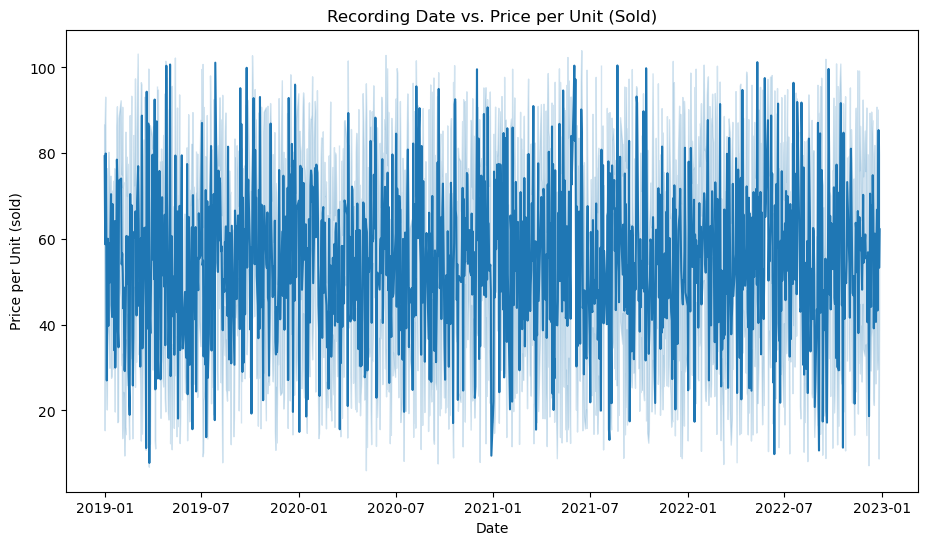

In [51]:
## Recording Date versus Price

plt.figure(figsize = (11,6))

sns.lineplot(x = dairy['Date'],
             y = dairy['Price per Unit (sold)'])

plt.title("Recording Date vs. Price per Unit (Sold)")

Text(0.5, 1.0, 'Recording Date vs. Price per Unit (sold) in 2019')

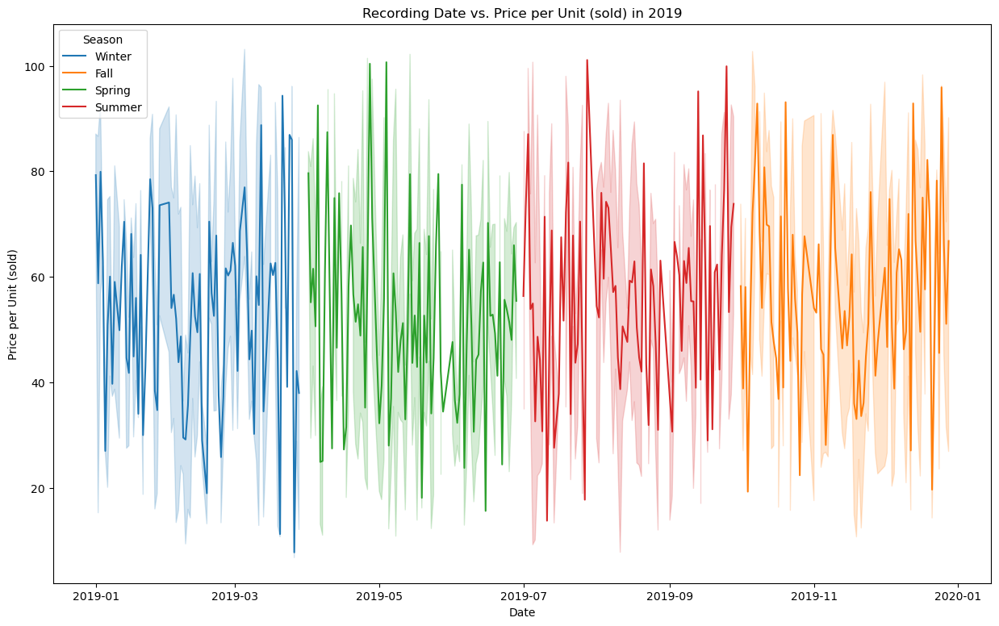

In [52]:
## Price in different seasons

plt.figure(figsize= (15,9))

sns.lineplot(x = dairy[dairy['Date'].dt.year == 2019]['Date'],
                y = dairy['Price per Unit (sold)'],
                hue = dairy.Season)

plt.title("Recording Date vs. Price per Unit (sold) in 2019")

In [46]:
dairy['Price per Unit (sold)'].describe()

count    4325.00000
mean       54.77914
std        26.19279
min         5.21000
25%        32.64000
50%        54.14000
75%        77.46000
max       104.51000
Name: Price per Unit (sold), dtype: float64

In [70]:
dairy.groupby(dairy['Date'].dt.month)['Price per Unit (sold)'].describe()

,count,mean,std,min,25%,50%,75%,max
Date,,,,,,,,
1,381.0,57.372362,25.109589,6.95,37.3400,56.880,80.6300,101.06
2,375.0,55.345360,26.686124,6.87,31.6300,56.150,78.2200,103.49
3,356.0,53.134522,25.143854,6.77,32.8575,52.045,72.6275,103.11
4,340.0,54.633971,26.355988,5.61,31.6325,53.360,76.8925,104.51
5,348.0,54.582730,27.676850,5.94,29.9500,54.340,79.6375,102.79
6,393.0,54.183461,26.229267,7.37,33.1400,51.250,75.3100,104.06
7,352.0,53.996080,25.821334,5.61,34.5425,51.145,76.2900,103.19
8,324.0,54.313827,26.229989,5.21,31.1125,55.345,78.1675,101.53
9,392.0,55.759082,26.704159,6.78,34.2825,55.545,78.4975,101.88


In [73]:
dairy['Quantity Sold (liters/kg)'].describe()

count    4325.000000
mean      248.095029
std       217.024182
min         1.000000
25%        69.000000
50%       189.000000
75%       374.000000
max       960.000000
Name: Quantity Sold (liters/kg), dtype: float64

In [72]:
dairy.groupby(dairy['Date'].dt.month)['Quantity Sold (liters/kg)'].describe()

,count,mean,std,min,25%,50%,75%,max
Date,,,,,,,,
1,381.0,262.485564,233.304247,1.0,69.00,191.0,404.00,928.0
2,375.0,247.733333,210.211501,1.0,70.00,216.0,365.50,956.0
3,356.0,245.856742,206.639836,1.0,82.00,188.0,376.25,945.0
4,340.0,224.650000,202.469498,1.0,60.75,169.0,320.25,949.0
5,348.0,248.353448,218.088060,1.0,69.75,182.5,382.50,921.0
6,393.0,256.587786,216.463017,1.0,74.00,205.0,384.00,879.0
7,352.0,232.406250,216.201584,1.0,66.75,157.5,343.00,949.0
8,324.0,274.373457,234.732770,1.0,76.75,214.0,427.50,960.0
9,392.0,243.561224,220.738939,1.0,58.00,178.0,383.75,916.0


In [78]:
dairy.loc[dairy.Date.dt.month <= 3]['Quantity Sold (liters/kg)'].describe()

count    1112.000000
mean      252.187050
std       217.238604
min         1.000000
25%        71.000000
50%       192.500000
75%       384.250000
max       956.000000
Name: Quantity Sold (liters/kg), dtype: float64

In [87]:
dairy.loc[(dairy.Date.dt.month <= 6) & (dairy.Date.dt.month > 3)]['Quantity Sold (liters/kg)'].describe()

count    1081.000000
mean      243.891767
std       212.926888
min         1.000000
25%        70.000000
50%       185.000000
75%       366.000000
max       949.000000
Name: Quantity Sold (liters/kg), dtype: float64

In [85]:
dairy.loc[(dairy.Date.dt.month <= 9) & (dairy.Date.dt.month > 6)]['Quantity Sold (liters/kg)'].describe()

count    1068.00000
mean      249.23221
std       224.07315
min         1.00000
25%        66.00000
50%       180.00000
75%       383.75000
max       960.00000
Name: Quantity Sold (liters/kg), dtype: float64

In [86]:
dairy.loc[(dairy.Date.dt.month <= 12) & (dairy.Date.dt.month > 9)]['Quantity Sold (liters/kg)'].describe()

count    1064.000000
mean      246.947368
std       213.929488
min         1.000000
25%        69.750000
50%       193.500000
75%       367.000000
max       934.000000
Name: Quantity Sold (liters/kg), dtype: float64

In [101]:
dairy.loc[dairy.Date.dt.month <= 3]['Price per Unit (sold)'].describe()

count    1112.000000
mean       55.332077
std        25.697674
min         6.770000
25%        33.370000
50%        54.375000
75%        77.742500
max       103.490000
Name: Price per Unit (sold), dtype: float64

In [103]:
dairy.loc[(dairy.Date.dt.month <= 6) & (dairy.Date.dt.month > 3)]['Price per Unit (sold)'].describe()

count    1081.000000
mean       54.453691
std        26.719022
min         5.610000
25%        31.880000
50%        53.130000
75%        78.380000
max       104.510000
Name: Price per Unit (sold), dtype: float64

In [104]:
dairy.loc[(dairy.Date.dt.month <= 9) & (dairy.Date.dt.month > 6)]['Price per Unit (sold)'].describe()

count    1068.000000
mean       54.739569
std        26.259140
min         5.210000
25%        32.905000
50%        54.165000
75%        77.640000
max       103.190000
Name: Price per Unit (sold), dtype: float64

In [105]:
dairy.loc[(dairy.Date.dt.month <= 12) & (dairy.Date.dt.month > 9)]['Price per Unit (sold)'].describe()

count    1064.000000
mean       54.571626
std        26.126534
min         6.580000
25%        32.272500
50%        54.500000
75%        76.620000
max       104.150000
Name: Price per Unit (sold), dtype: float64

In [107]:
dairy.groupby(dairy['Customer Location'])['Quantity Sold (liters/kg)'].describe()

,count,mean,std,min,25%,50%,75%,max
Customer Location,,,,,,,,
Bihar,284.0,273.042254,229.773121,1.0,74.50,216.5,427.50,913.0
Chandigarh,489.0,234.709611,203.020283,1.0,65.00,181.0,346.00,928.0
Delhi,499.0,237.683367,211.821977,1.0,70.00,178.0,351.50,940.0
Gujarat,248.0,257.814516,231.830154,2.0,67.75,182.5,391.00,949.0
Haryana,229.0,235.576419,218.353386,1.0,48.00,166.0,355.00,915.0
Jharkhand,243.0,250.823045,217.333991,1.0,80.50,197.0,354.50,901.0
Karnataka,264.0,255.189394,217.376218,1.0,74.75,195.5,373.25,894.0
Kerala,267.0,250.741573,218.519568,1.0,72.00,206.0,366.00,925.0
Madhya Pradesh,248.0,242.266129,203.527181,1.0,63.75,201.5,373.00,949.0


In [108]:
dairy.groupby(dairy['Location'])['Quantity Sold (liters/kg)'].describe()

,count,mean,std,min,25%,50%,75%,max
Location,,,,,,,,
Bihar,245.0,254.673469,224.414282,1.0,56.00,219.0,371.00,926.0
Chandigarh,519.0,259.393064,224.062008,1.0,75.00,204.0,393.00,949.0
Delhi,525.0,247.801905,214.906972,1.0,72.00,193.0,381.00,956.0
Gujarat,267.0,239.913858,200.337075,1.0,79.50,173.0,369.00,925.0
Haryana,253.0,236.474308,217.945631,1.0,68.00,166.0,372.00,934.0
Jharkhand,248.0,233.536290,211.722774,1.0,61.00,158.0,352.25,945.0
Karnataka,261.0,237.689655,217.579922,1.0,60.00,165.0,363.00,949.0
Kerala,249.0,241.891566,221.740840,1.0,73.00,171.0,366.00,931.0
Madhya Pradesh,259.0,249.154440,203.704089,1.0,87.00,200.0,371.50,928.0


## Targeting Specific Features (Location, Brand)

In [126]:
dairy['Location'].unique()

array(['Telangana', 'Uttar Pradesh', 'Tamil Nadu', 'Maharashtra',
       'Karnataka', 'Bihar', 'West Bengal', 'Madhya Pradesh',
       'Chandigarh', 'Delhi', 'Gujarat', 'Kerala', 'Jharkhand',
       'Rajasthan', 'Haryana'], dtype=object)

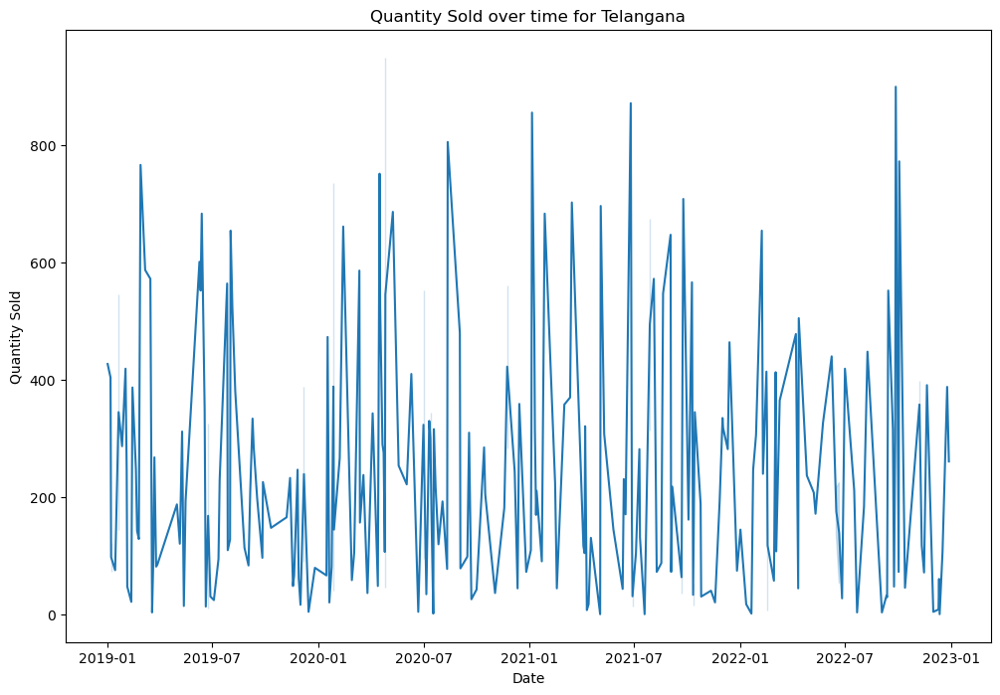

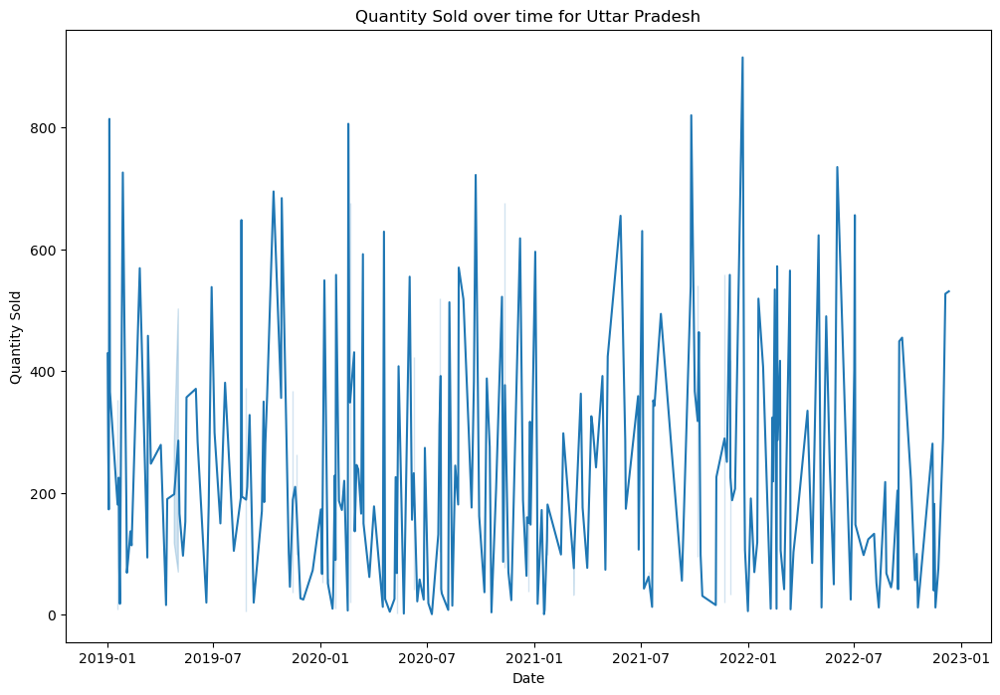

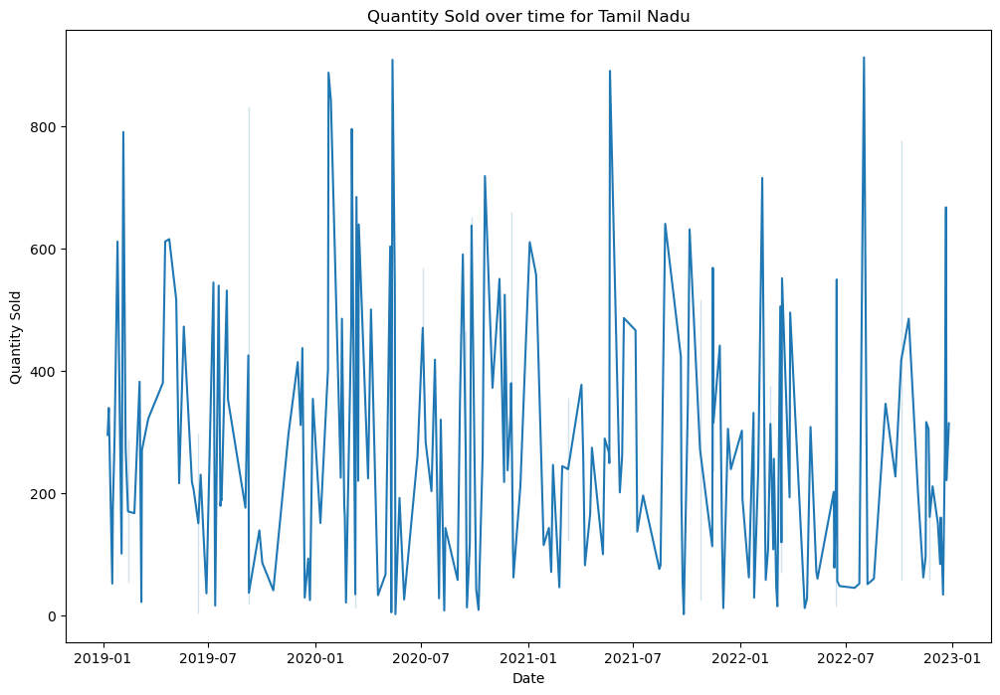

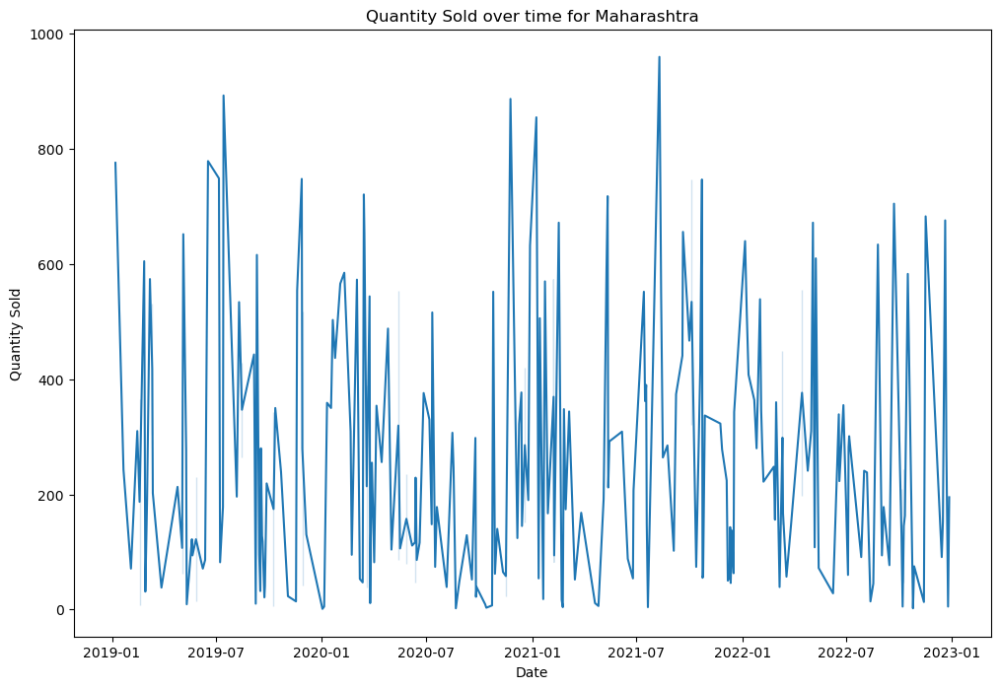

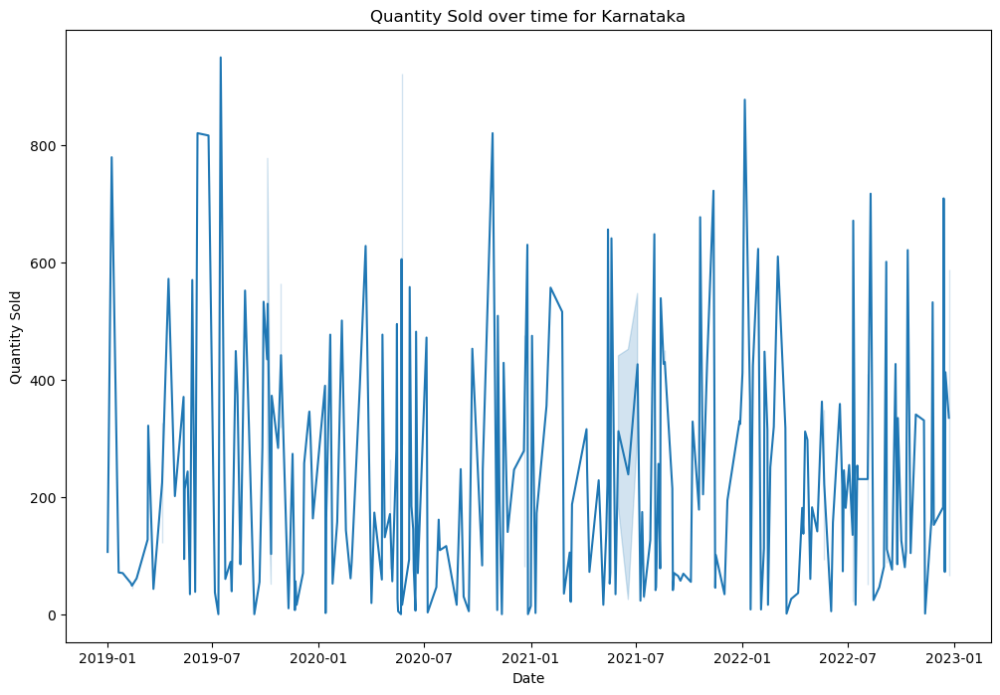

...

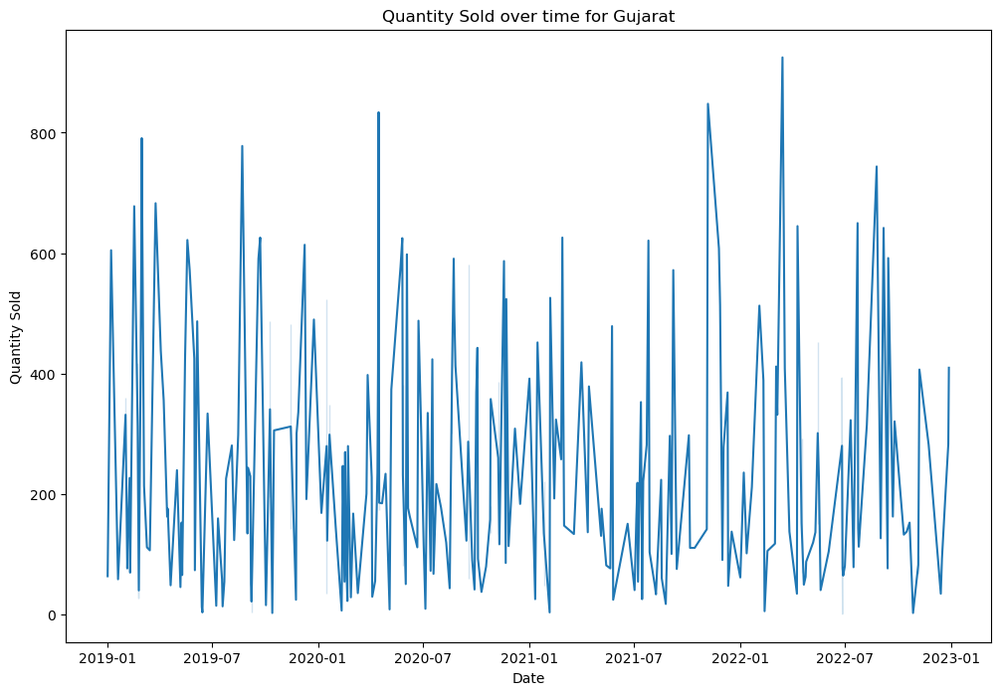

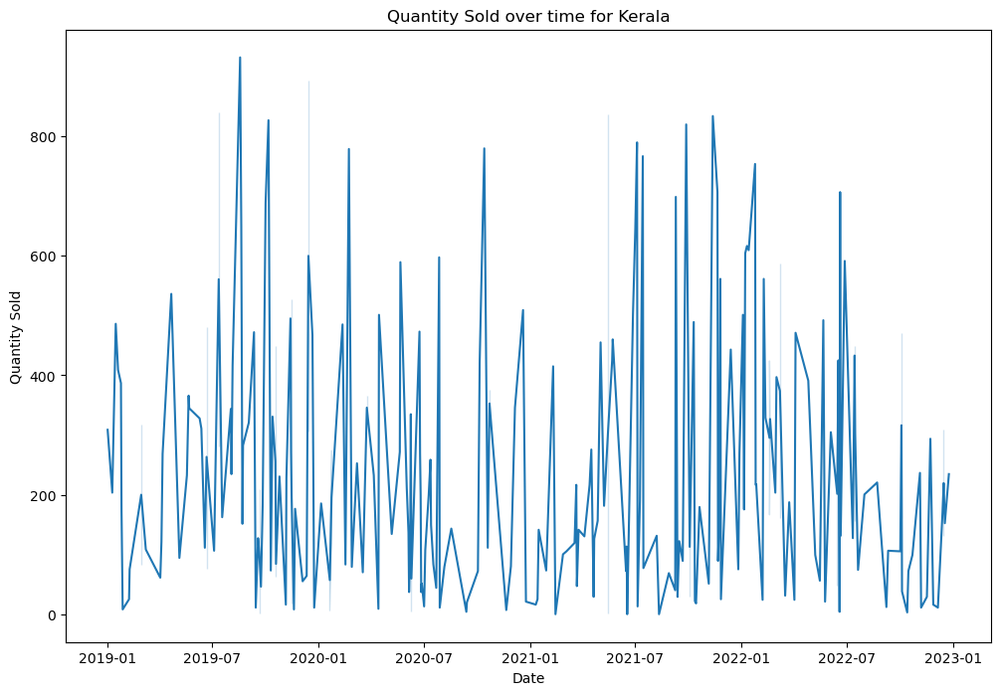

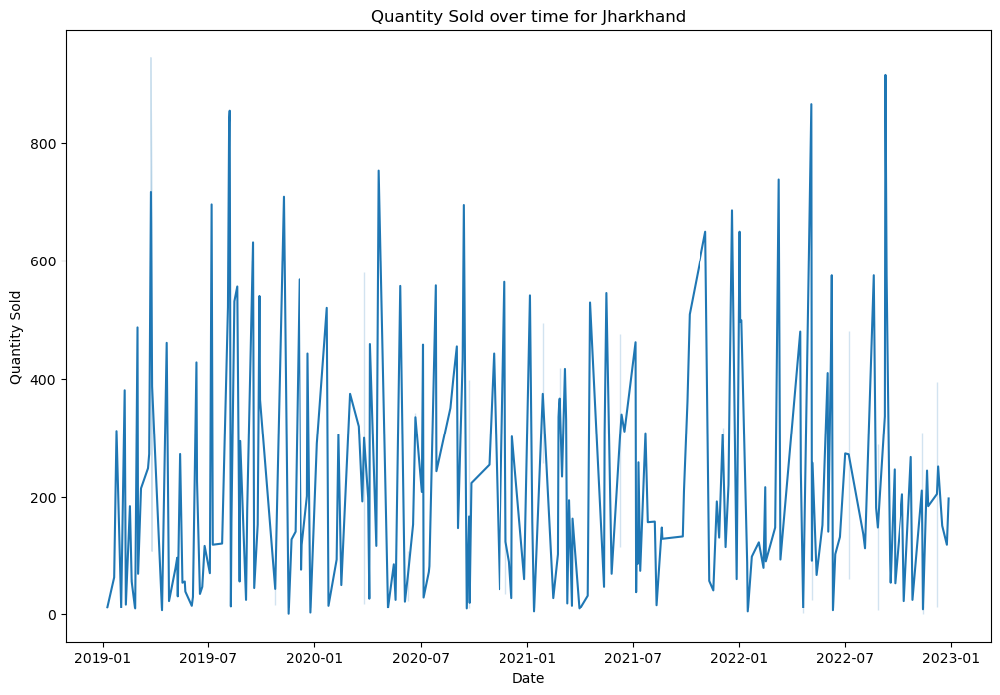

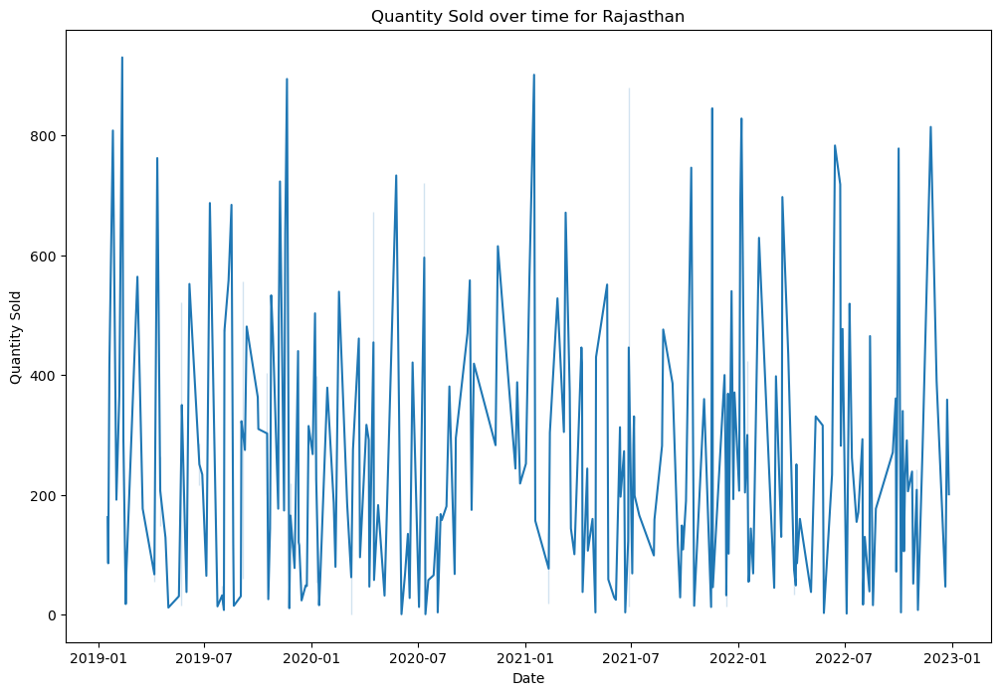

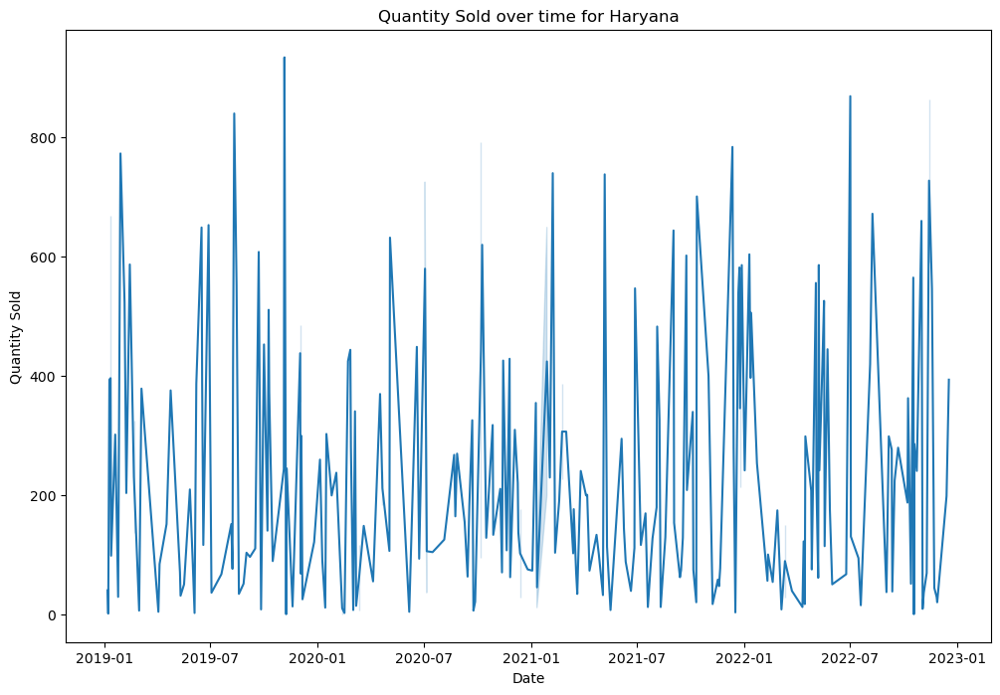

In [ ]:
## How Quantity Sold over time might differ for different locations?

for location in dairy['Location'].unique():
    plt.figure(figsize=(12,8))
    sns.lineplot(x = dairy[dairy['Location'] == location]['Date'],
                 y = dairy['Quantity Sold (liters/kg)'])
    plt.xlabel("Date")
    plt.ylabel("Quantity Sold")
    plt.title("Quantity Sold over time for " + location)
    plt.show()

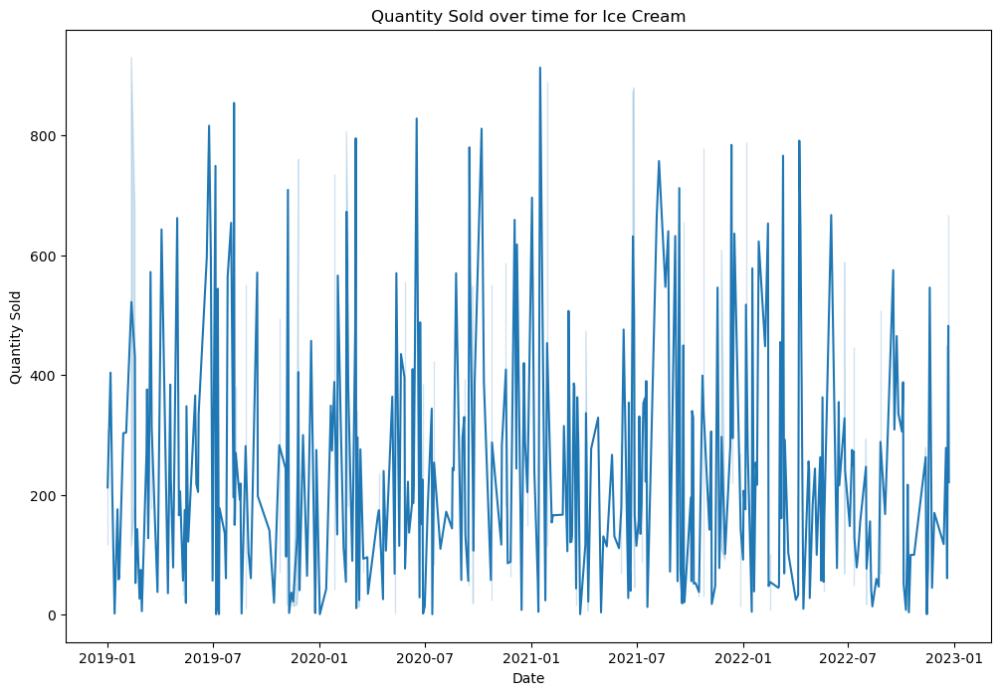

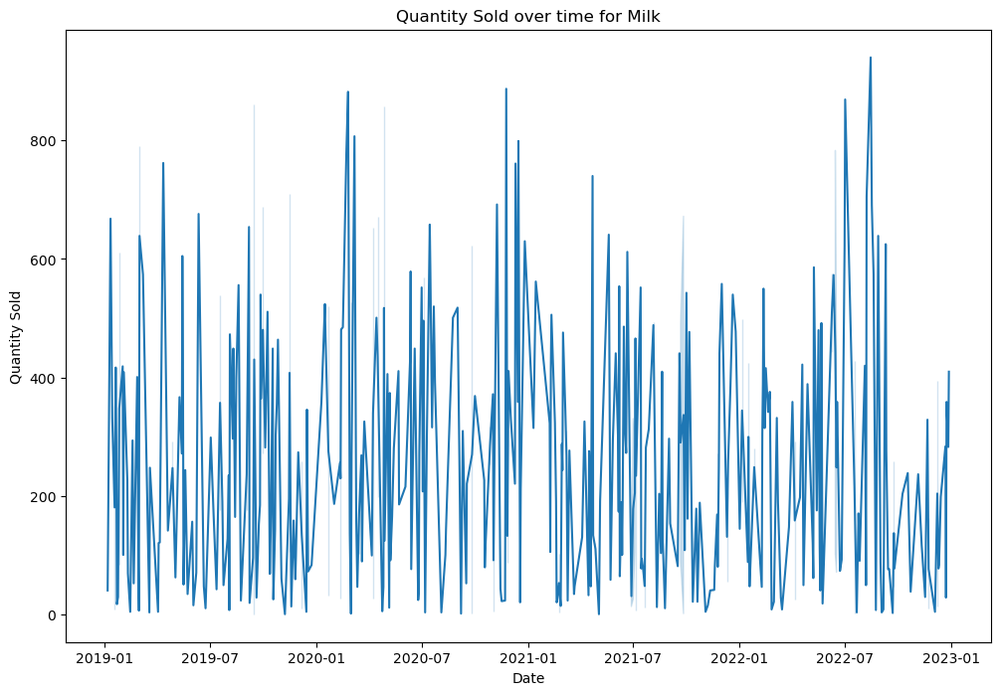

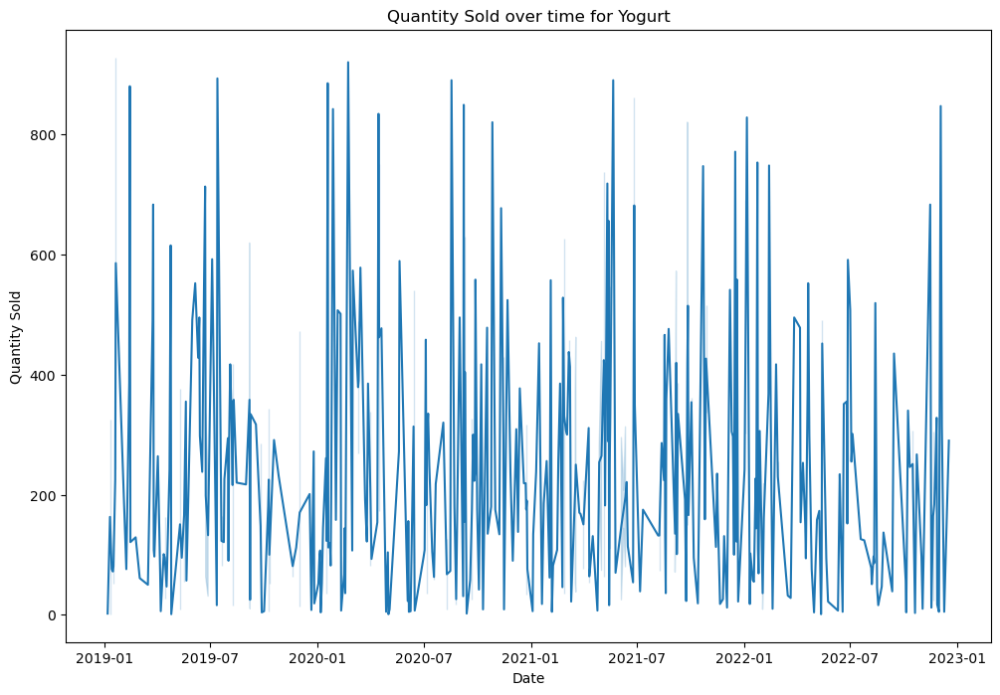

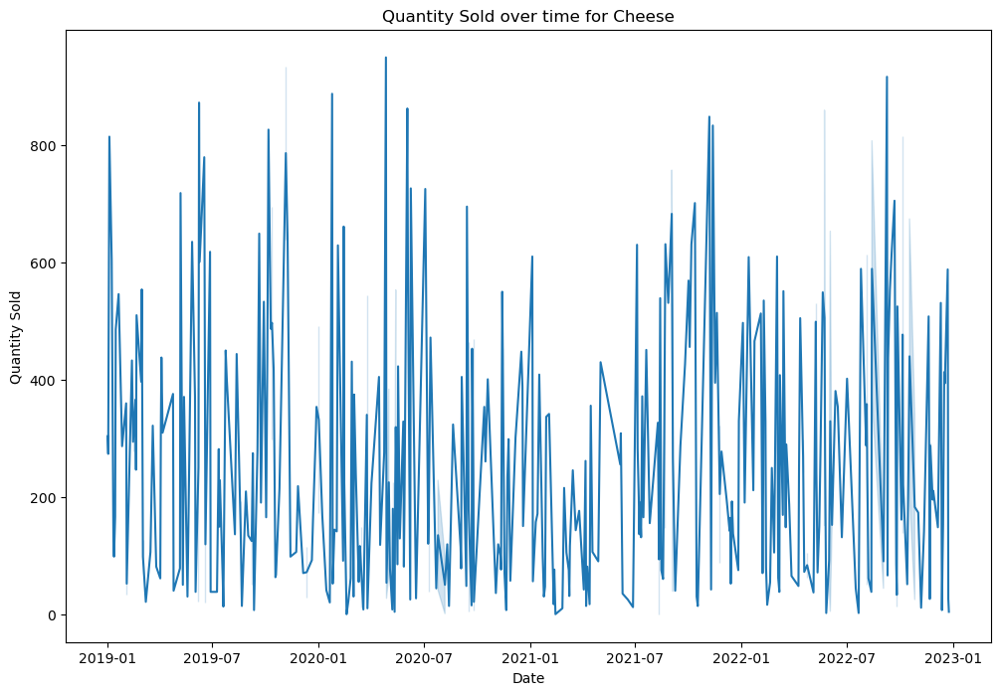

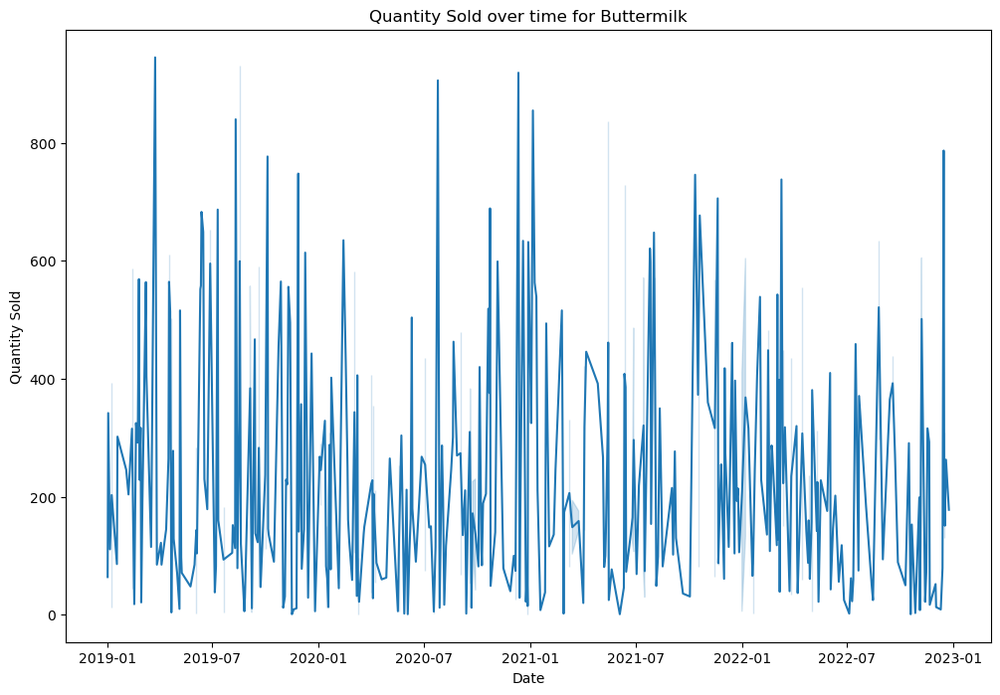

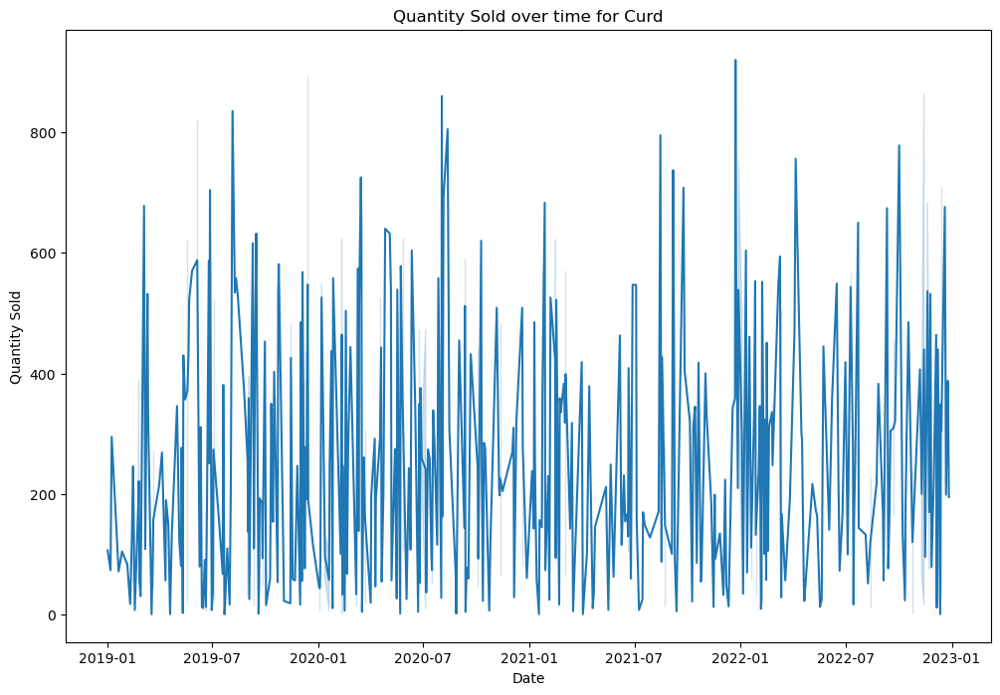

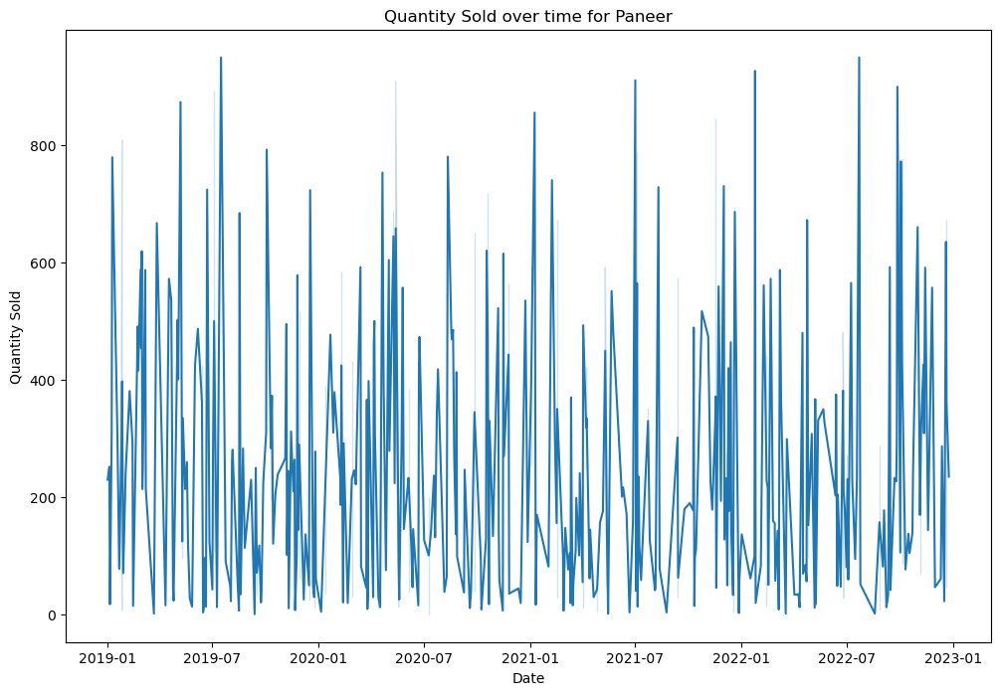

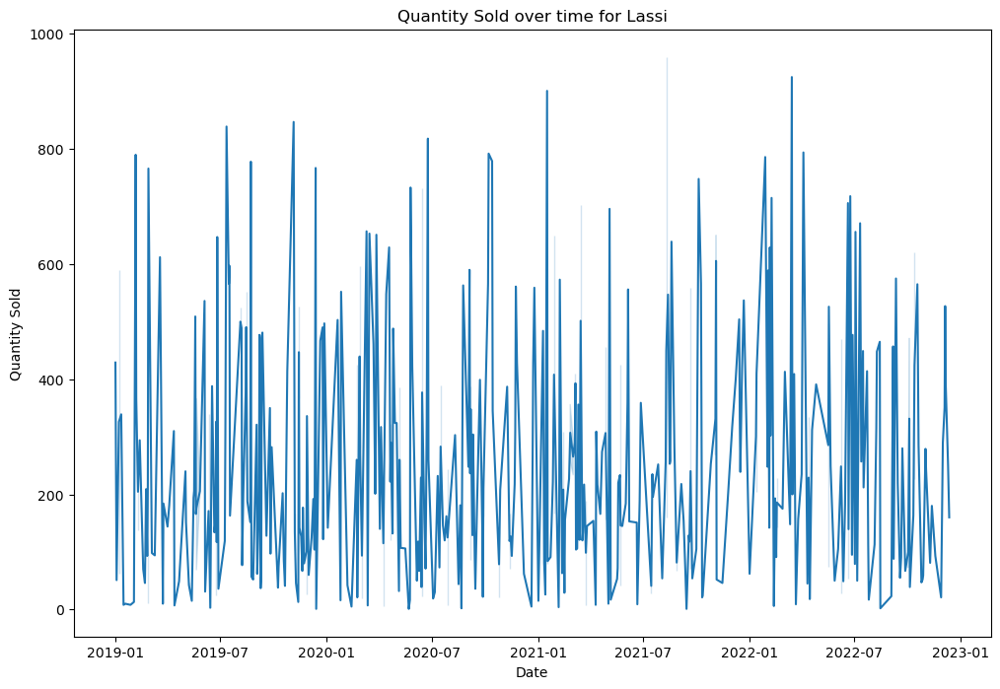

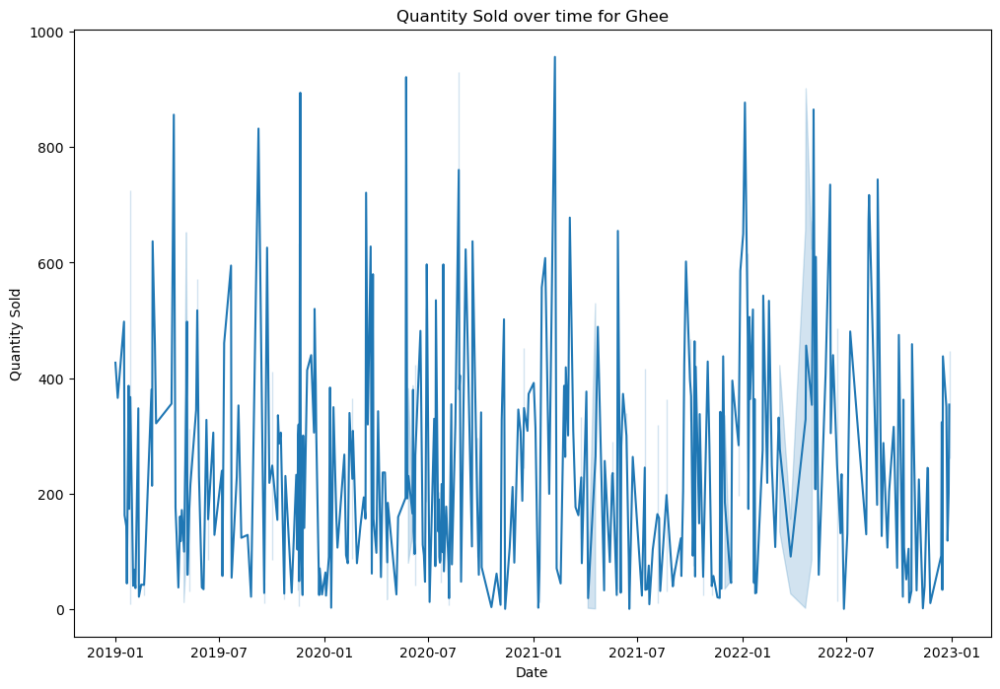

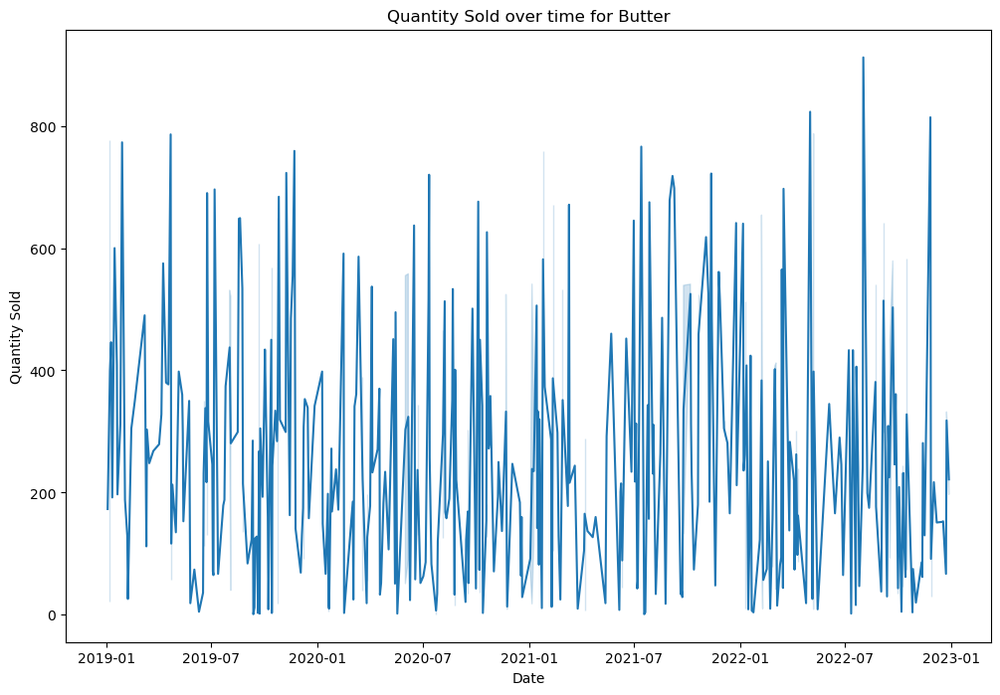

In [ ]:
## How Quantity Sold over time might differ for different products

for product in dairy['Product Name'].unique():
    plt.figure(figsize=(12,8))
    sns.lineplot(x = dairy[dairy['Product Name'] == product]['Date'],
                 y = dairy['Quantity Sold (liters/kg)'])
    plt.xlabel("Date")
    plt.ylabel("Quantity Sold")
    plt.title("Quantity Sold over time for " + product)
    plt.show()

In [54]:
import seaborn.objects as so

## Looking at How Products, Locations, and Brands might be connected

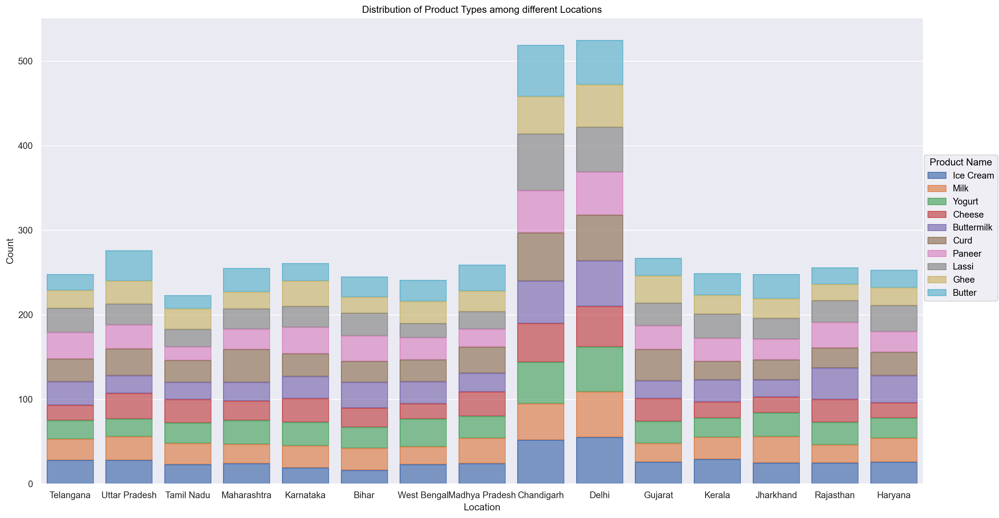

<Figure size 2000x900 with 0 Axes>

In [56]:
## What locations by/sell what products?

plt.figure(figsize = (20,9))
p = so.Plot(dairy, x = "Location", color = "Product Name").add(so.Bar(), so.Count(), so.Stack()).layout(size = (16,9))
p.label(x = "Location", y = "Count", title = "Distribution of Product Types among different Locations")

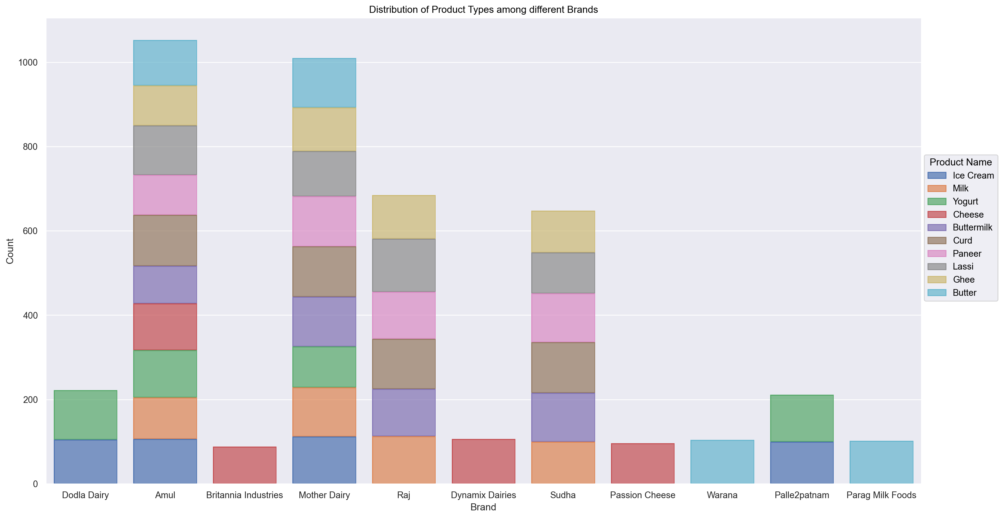

<Figure size 2000x900 with 0 Axes>

In [57]:
## What companies sell what products?

plt.figure(figsize = (20,9))
p = so.Plot(dairy, x = "Brand", color = "Product Name").add(so.Bar(), so.Count(), so.Stack()).layout(size = (16,9))
p.label(x = "Brand", y = "Count", title = "Distribution of Product Types among different Brands")

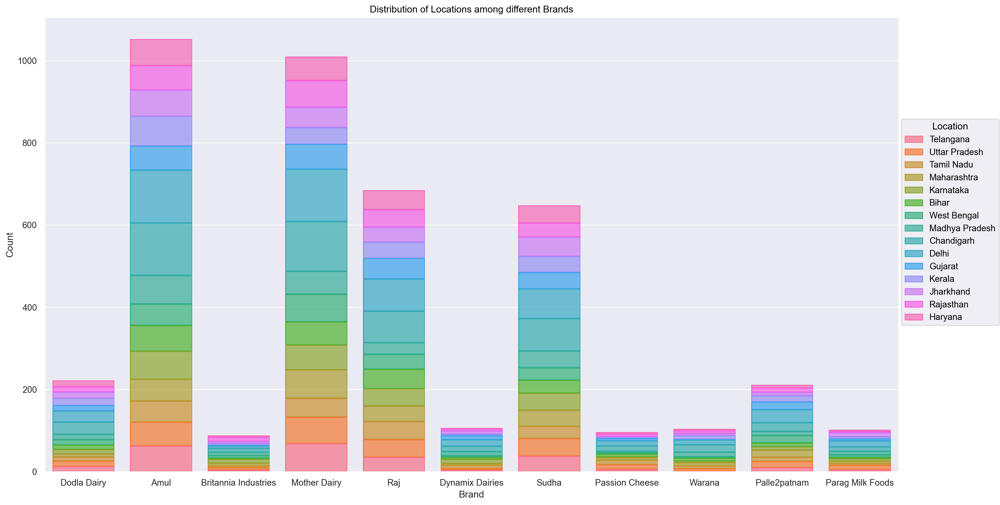

<Figure size 2000x900 with 0 Axes>

In [58]:
## What brands sell to different locations?

plt.figure(figsize = (20,9))
p = so.Plot(dairy, x = "Brand", color = "Location").add(so.Bar(), so.Count(), so.Stack()).layout(size = (16,9))
p.label(x = "Brand", y = "Count", title = "Distribution of Locations among different Brands")

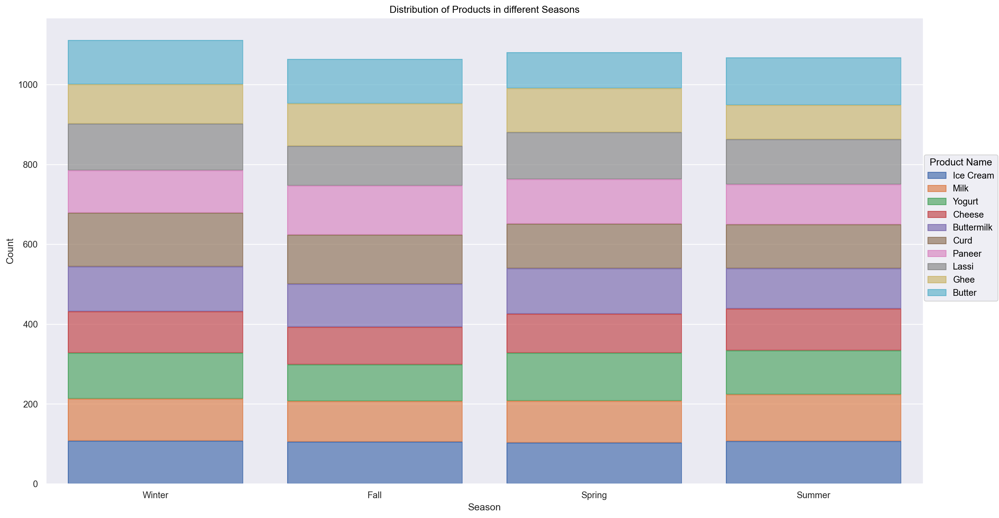

<Figure size 2000x900 with 0 Axes>

In [ ]:
## Are certain products bought more often in different seasons?

plt.figure(figsize = (20,9))
p = so.Plot(dairy, x = "Season", color = "Product Name").add(so.Bar(), so.Count(), so.Stack()).layout(size = (16,9))
p.label(x = "Season", y = "Count", title = "Distribution of Products in different Seasons")

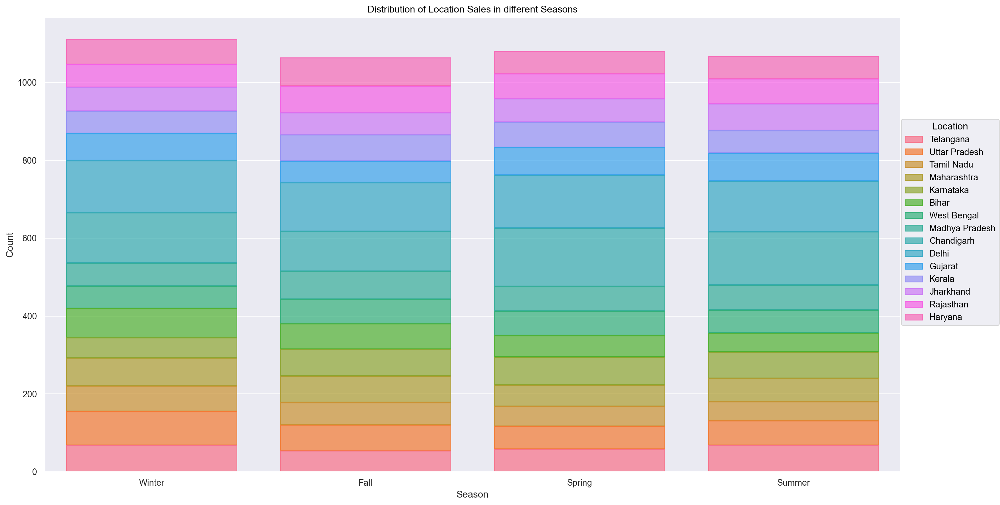

<Figure size 2000x900 with 0 Axes>

In [ ]:
## Location Sales and Seasons

plt.figure(figsize = (20,9))
p = so.Plot(dairy, x = "Season", color = "Location").add(so.Bar(), so.Count(), so.Stack()).layout(size = (16,9))
p.label(x = "Season", y = "Count", title = "Distribution of Location Sales in different Seasons")

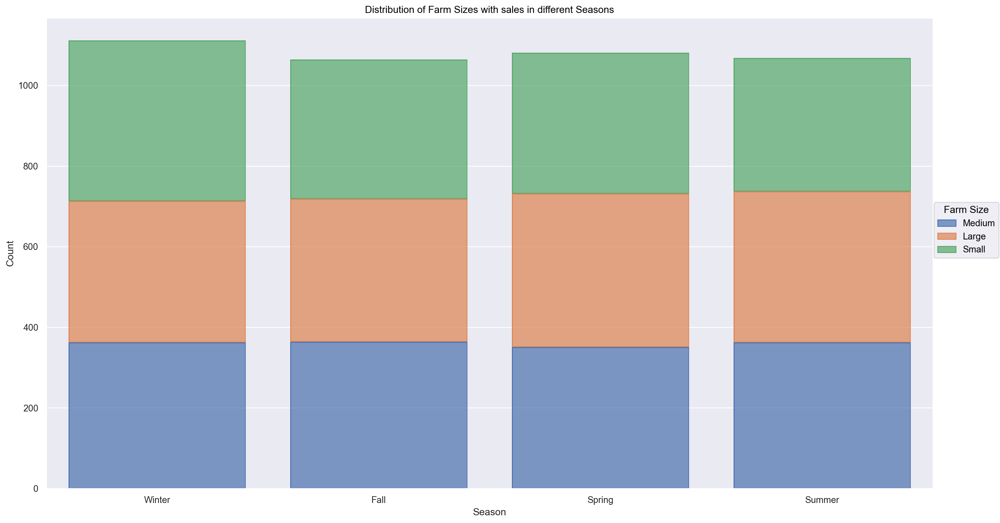

<Figure size 2000x900 with 0 Axes>

In [ ]:
## Farm Size and Seasons

plt.figure(figsize = (20,9))
p = so.Plot(dairy, x = "Season", color = "Farm Size").add(so.Bar(), so.Count(), so.Stack()).layout(size = (16,9))
p.label(x = "Season", y = "Count", title = "Distribution of Farm Sizes with sales in different Seasons")

In [150]:
dairy.groupby("Season")["Production to Expiration"].describe()

,count,mean,std,min,25%,50%,75%,max
Season,,,,,,,,
Fall,1064.0,30.125000,32.221925,1.0,10.0,22.0,30.0,149.0
Spring,1081.0,29.431082,30.731169,1.0,10.0,22.0,30.0,150.0
Summer,1068.0,28.410112,29.010491,1.0,11.0,22.0,30.0,150.0
Winter,1112.0,28.567446,29.069657,1.0,10.0,22.0,30.0,150.0


In [151]:
dairy.groupby("Product Name")["Production to Expiration"].describe()

,count,mean,std,min,25%,50%,75%,max
Product Name,,,,,,,,
Butter,431.0,32.932715,4.771292,25.0,29.0,33.0,37.0,40.0
Buttermilk,435.0,10.572414,2.261921,7.0,9.0,11.0,13.0,14.0
Cheese,401.0,57.324190,17.940726,25.0,43.0,57.0,72.0,90.0
Curd,479.0,6.025052,0.817819,5.0,5.0,6.0,7.0,7.0
Ghee,402.0,105.741294,26.953229,60.0,83.0,106.0,130.0,150.0
Ice Cream,423.0,25.458629,2.882792,21.0,23.0,25.0,28.0,30.0
Lassi,447.0,14.847875,1.949851,12.0,13.0,15.0,16.0,18.0
Milk,429.0,12.923077,12.192236,1.0,1.0,2.0,25.0,30.0
Paneer,441.0,10.662132,2.270692,7.0,9.0,11.0,13.0,14.0


In [ ]:
## Recording Date to Expiration Date - this tipped us off that the 'date' column was in fact just recording date, not date of sale.
## We changed to time series based on production date

dairy[['Expiration Date', 'Date']] = dairy[['Expiration Date', 'Date']].apply(pd.to_datetime)
dairy['Sale to Expiration'] = (dairy['Expiration Date'] - dairy['Date']).dt.days
dairy.head()

,Location,Total Land Area (acres),Number of Cows,Farm Size,Date,Product ID,Product Name,Brand,Quantity (liters/kg),Price per Unit,...,Approx. Total Revenue(INR),Customer Location,Sales Channel,Quantity in Stock (liters/kg),Minimum Stock Threshold (liters/kg),Reorder Quantity (liters/kg),Normalized Approx. Total Rev,Production to Expiration,Season,Sale to Expiration
0,Telangana,310.84,96,Medium,2022-02-17,5,Ice Cream,Dodla Dairy,222.40,85.72,...,575.68,Madhya Pradesh,Wholesale,215,19.55,64.03,-0.889689,25,Winter,-27
1,Uttar Pradesh,19.19,44,Large,2021-12-01,1,Milk,Amul,687.48,42.61,...,21895.92,Kerala,Wholesale,129,43.17,181.10,0.568903,22,Fall,-37
2,Tamil Nadu,581.69,24,Medium,2022-02-28,4,Yogurt,Dodla Dairy,503.48,36.50,...,8655.36,Madhya Pradesh,Online,247,15.10,140.83,-0.336930,30,Winter,-15
3,Telangana,908.00,89,Small,2019-06-09,3,Cheese,Britannia Industries,823.36,26.52,...,17380.92,Rajasthan,Online,222,74.50,57.68,0.260016,72,Spring,47
4,Maharashtra,861.95,21,Medium,2020-12-14,8,Buttermilk,Mother Dairy,147.77,83.85,...,12045.15,Jharkhand,Retail,2,76.02,33.40,-0.105023,11,Fall,-47


In [153]:
dairy.columns

Index(['Location', 'Total Land Area (acres)', 'Number of Cows', 'Farm Size',
       'Date', 'Product ID', 'Product Name', 'Brand', 'Quantity (liters/kg)',
       'Price per Unit', 'Total Value', 'Shelf Life (days)',
       'Storage Condition', 'Production Date', 'Expiration Date',
       'Quantity Sold (liters/kg)', 'Price per Unit (sold)',
       'Approx. Total Revenue(INR)', 'Customer Location', 'Sales Channel',
       'Quantity in Stock (liters/kg)', 'Minimum Stock Threshold (liters/kg)',
       'Reorder Quantity (liters/kg)', 'Normalized Approx. Total Rev',
       'Production to Expiration', 'Season', 'Sale to Expiration'],
      dtype='object')

In [156]:
dairy[['Expiration Date', 'Date']]

,Expiration Date,Date
0,2022-01-21,2022-02-17
1,2021-10-25,2021-12-01
2,2022-02-13,2022-02-28
3,2019-07-26,2019-06-09
4,2020-10-28,2020-12-14
...,...,...
4320,2022-02-21,2022-02-24
4321,2022-04-14,2022-05-14
4322,2020-01-11,2020-01-05
4323,2022-10-09,2022-10-25


In [157]:
dairy.groupby("Product Name")["Sale to Expiration"].describe()

,count,mean,std,min,25%,50%,75%,max
Product Name,,,,,,,,
Butter,431.0,2.721578,17.881821,-34.0,-11.0,2.0,17.5,39.0
Buttermilk,435.0,-20.358621,17.624479,-53.0,-36.0,-20.0,-6.0,11.0
Cheese,401.0,26.912718,25.058030,-32.0,10.0,25.0,45.0,87.0
Curd,479.0,-24.062630,17.536222,-55.0,-40.0,-23.0,-9.0,6.0
Ghee,402.0,74.771144,33.815730,4.0,50.0,72.0,101.0,147.0
Ice Cream,423.0,-4.841608,18.247663,-39.0,-22.0,-4.0,11.0,29.0
Lassi,447.0,-14.682327,17.017986,-48.0,-29.0,-15.0,0.0,17.0
Milk,429.0,-18.778555,20.961355,-59.0,-33.0,-18.0,-3.0,28.0
Paneer,441.0,-20.709751,17.461701,-53.0,-36.0,-20.0,-7.0,13.0


In [172]:
dairy[dairy['Product Name'] == 'Curd'][dairy['Brand'] == 'Amul']

C:\Users\tatep\AppData\Local\Temp\ipykernel_1392\3800585594.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dairy[dairy['Product Name'] == 'Curd'][dairy['Brand'] == 'Amul']


,Location,Total Land Area (acres),Number of Cows,Farm Size,Date,Product ID,Product Name,Brand,Quantity (liters/kg),Price per Unit,...,Approx. Total Revenue(INR),Customer Location,Sales Channel,Quantity in Stock (liters/kg),Minimum Stock Threshold (liters/kg),Reorder Quantity (liters/kg),Normalized Approx. Total Rev,Production to Expiration,Season,Sale to Expiration
17,Kerala,412.69,88,Medium,2020-06-24,6,Curd,Amul,385.41,26.18,...,8172.90,Madhya Pradesh,Online,115,52.16,20.14,-0.369937,6,Spring,-41
39,Jharkhand,373.77,79,Medium,2021-06-09,6,Curd,Amul,267.21,27.31,...,2623.92,Kerala,Wholesale,151,53.34,42.38,-0.749561,6,Spring,-46
82,Jharkhand,175.31,69,Large,2020-06-09,6,Curd,Amul,336.47,65.23,...,6651.72,West Bengal,Wholesale,228,63.42,100.69,-0.474006,6,Spring,-46
99,Gujarat,305.81,66,Medium,2021-07-05,6,Curd,Amul,242.26,26.85,...,4063.76,Jharkhand,Retail,84,58.30,186.84,-0.651057,7,Summer,3
140,Tamil Nadu,976.02,95,Small,2019-02-24,6,Curd,Amul,488.83,42.69,...,6850.34,Delhi,Wholesale,321,97.56,36.85,-0.460417,6,Winter,-5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3799,Rajasthan,25.29,79,Small,2019-08-12,6,Curd,Amul,871.22,64.90,...,38256.48,Telangana,Online,313,74.96,37.53,1.688185,6,Summer,-52
4045,Chandigarh,375.44,30,Large,2021-08-15,6,Curd,Amul,905.93,82.55,...,68115.60,Kerala,Retail,110,84.80,105.63,3.730950,7,Summer,-44
4084,Gujarat,184.38,12,Medium,2020-02-22,6,Curd,Amul,842.68,76.40,...,22069.60,Chandigarh,Online,562,44.30,186.57,0.580785,6,Winter,-31
4094,Karnataka,195.39,92,Medium,2021-11-16,6,Curd,Amul,136.21,87.24,...,8984.16,Karnataka,Online,34,73.10,27.39,-0.314435,5,Fall,-4


In [ ]:
(dairy.Date.dt.month <= 12) & (dairy.Date.dt.month > 9)

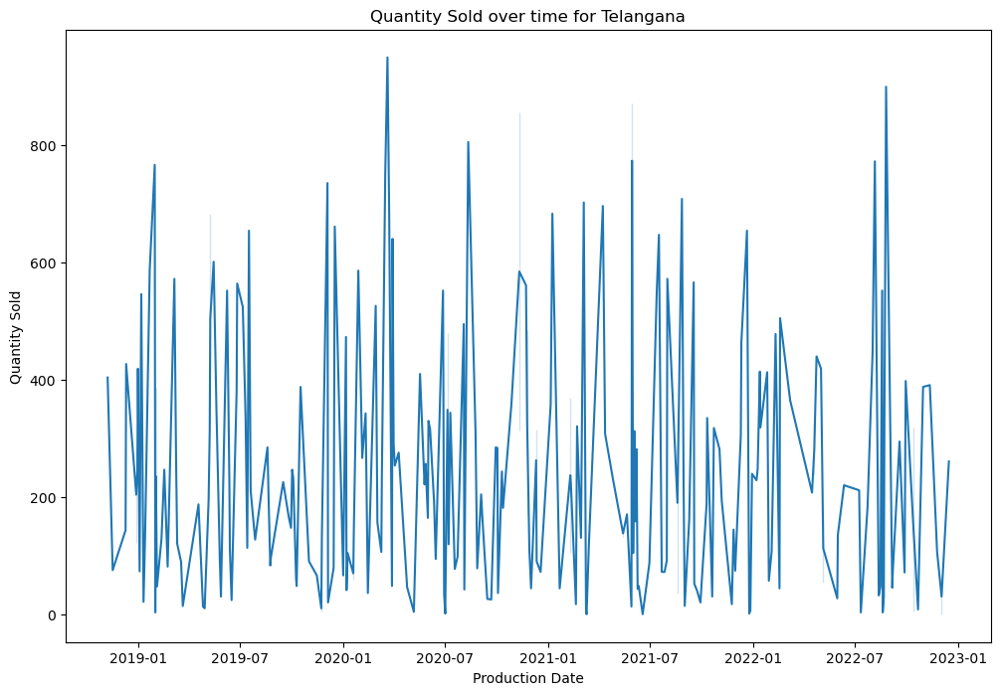

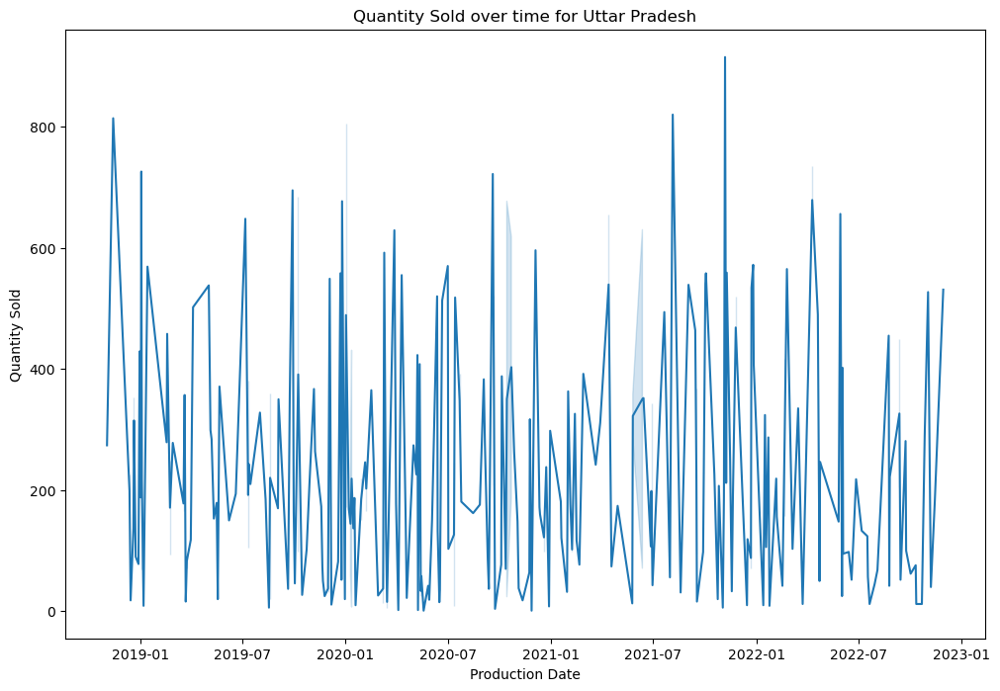

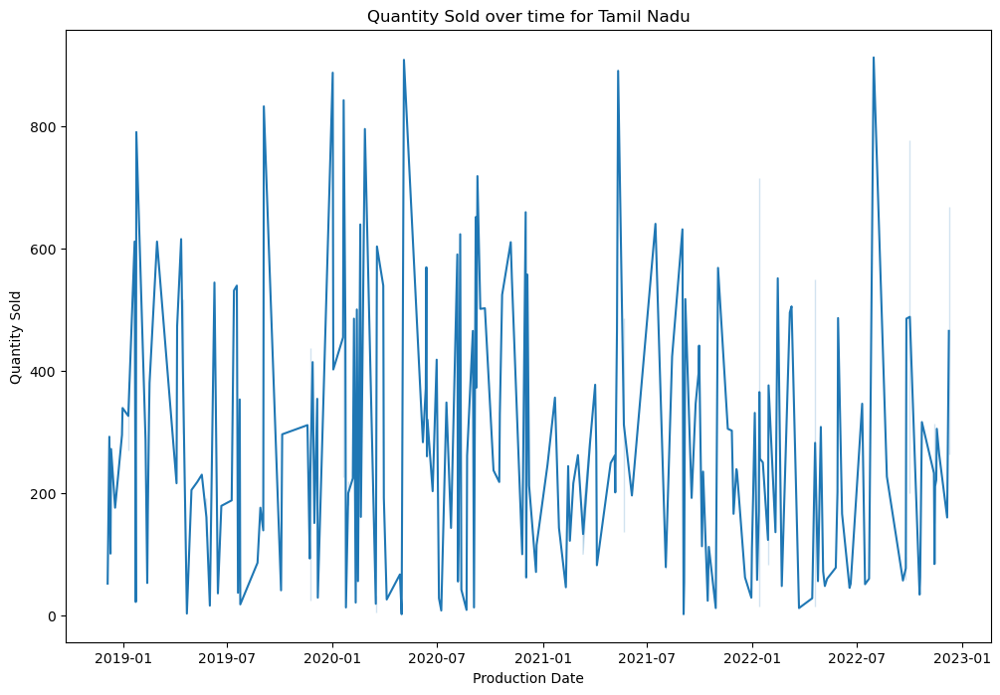

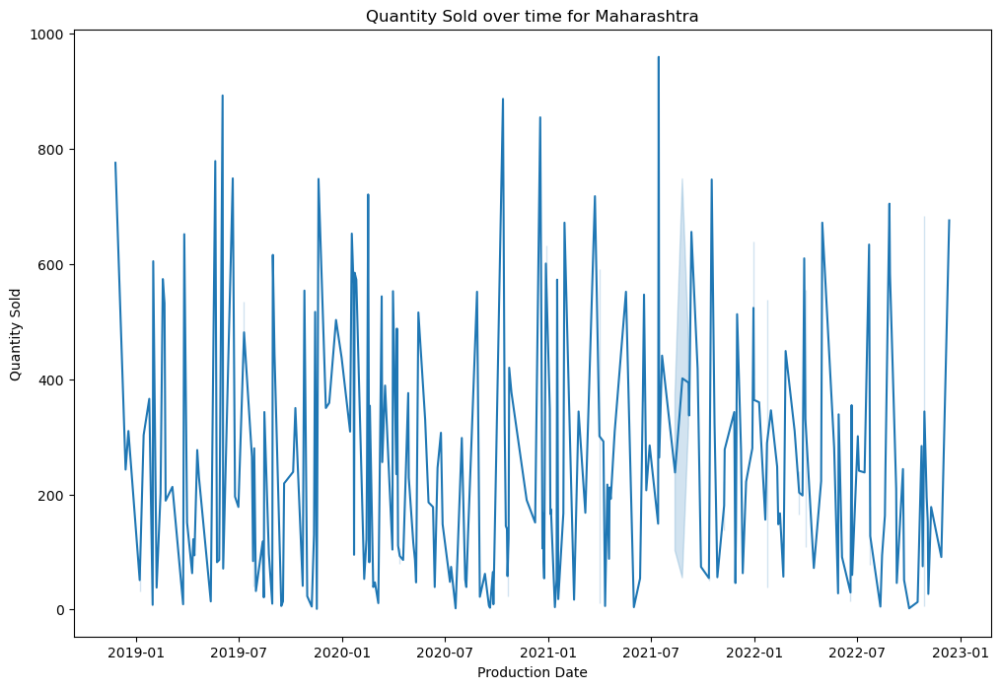

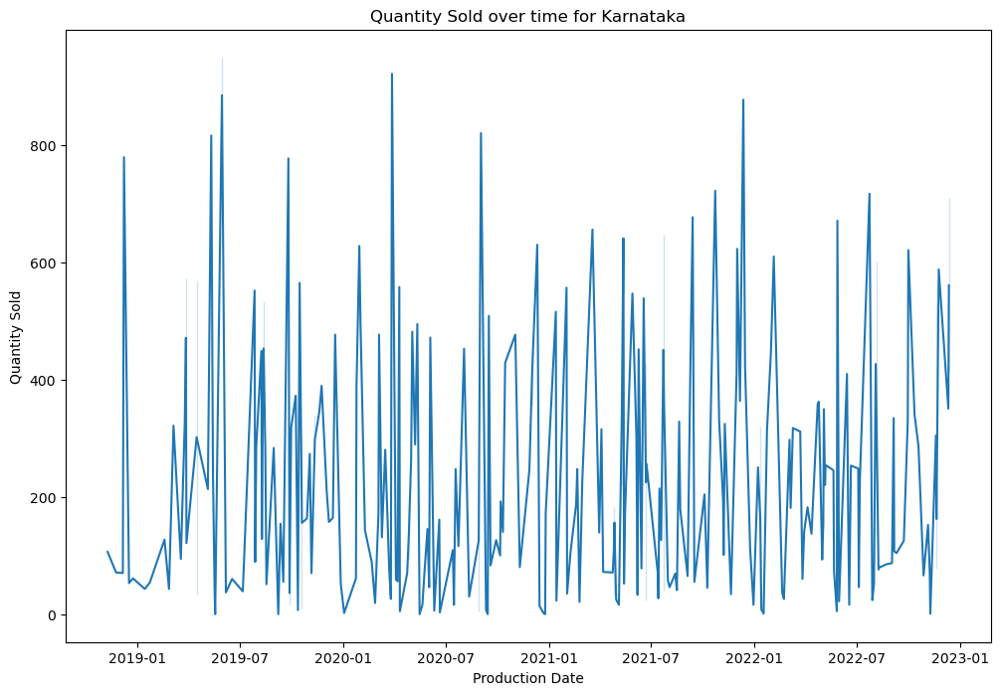

...

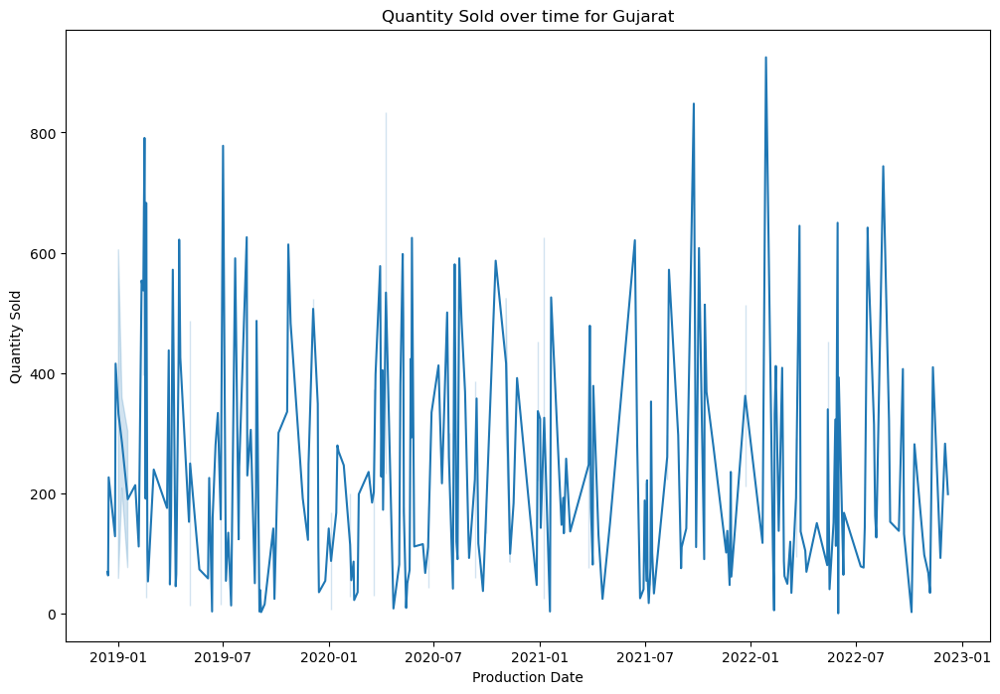

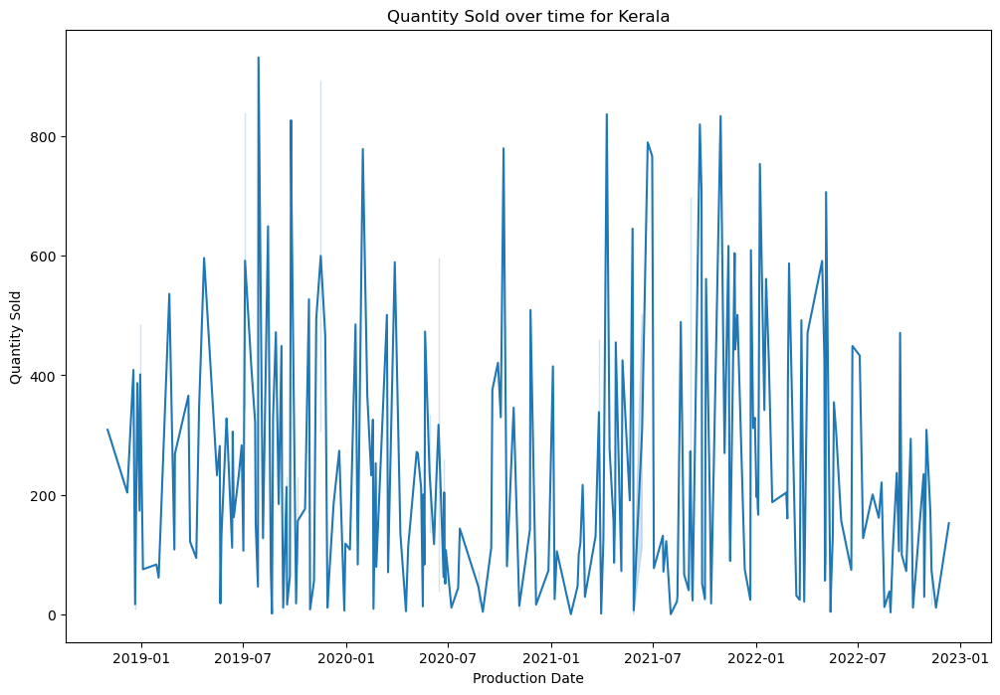

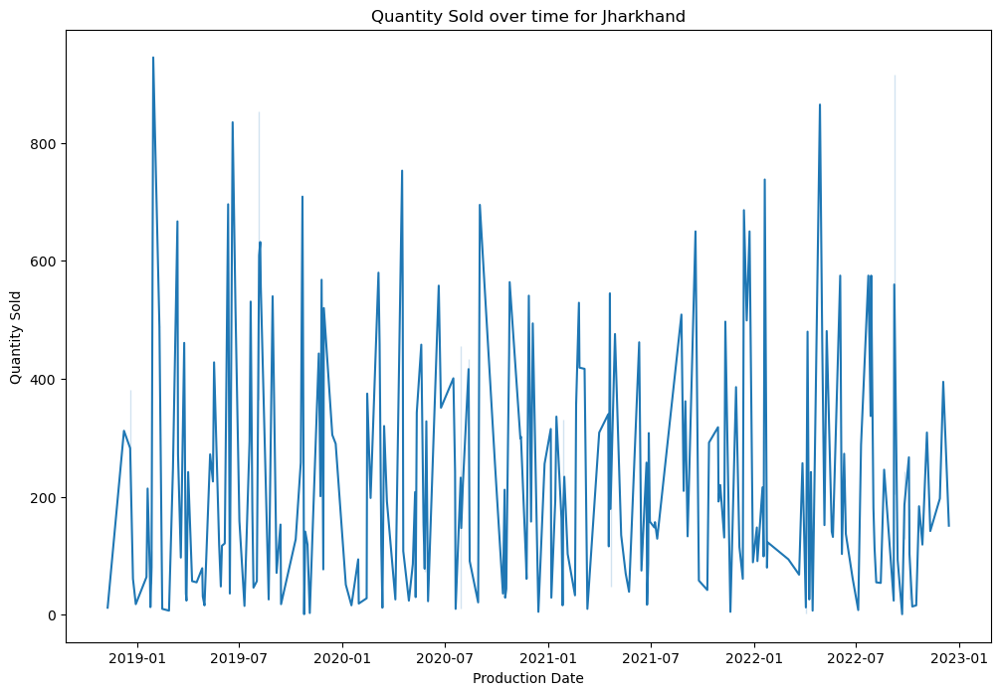

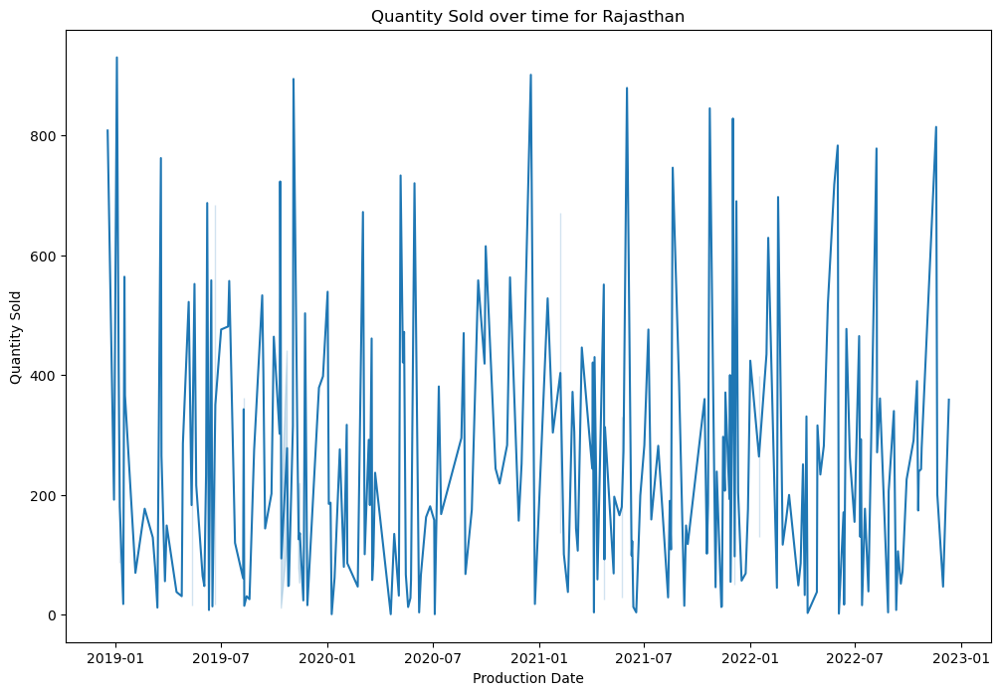

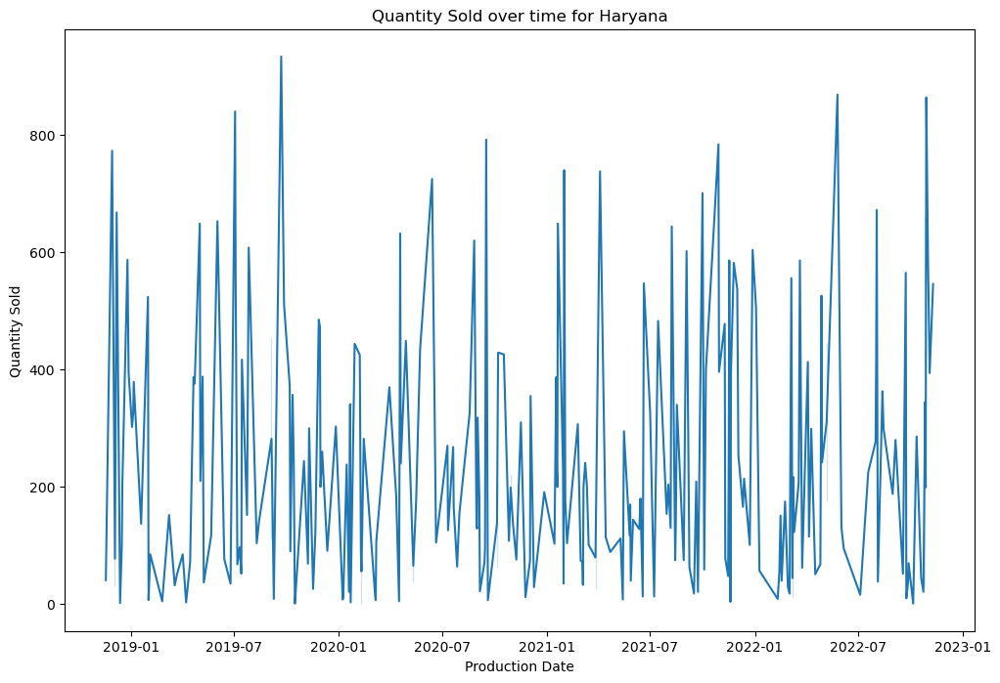

In [ ]:
## Production Date versus Quantity Sold in different locations

for location in dairy['Location'].unique():
    plt.figure(figsize=(12,8))
    sns.lineplot(x = dairy[dairy['Location'] == location]['Production Date'],
                 y = dairy['Quantity Sold (liters/kg)'])
    plt.xlabel("Production Date")
    plt.ylabel("Quantity Sold")
    plt.title("Quantity Sold over time for " + location)
    plt.show()